In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam')
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/shared_helper_modules'))

# General imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
import pickle

warnings.filterwarnings(
    "ignore",
    message="use_inf_as_na option is deprecated",
    category=FutureWarning,
    module="seaborn")

warnings.filterwarnings(
    "ignore",
    message=r"invalid value encountered in log10",
    category=RuntimeWarning,
    module=r".*specparam.*",
)


# NeuroDSP and FOOOF modules
from neurodsp import spectral

from specparam import Bands


# Custom modules

from spk_feat_cluster_analysis import *

from spe1_plotting import *
from spikeparam.patch.fit import Spike

from config import NPX_CHANNELS, CELL_IDS, DICT_PATCH_FS, DICT_CHAN_PRED, DICT_SPK_THRESH, FILTER_SETTINGS, SPE1_DATA_ROOT, SPE1_PICKLE_ROOT


In [3]:
cell_num = 5 #MODIFY THIS WHEN RUNNING DIFFERENT CELLS 

npx_fs = 30000 # sampling rate
lfp_fs = 3500 # sampling rate

patch_fs = DICT_PATCH_FS[cell_num ]
spk_thresh = DICT_SPK_THRESH[cell_num]

npx_channels = NPX_CHANNELS
npx_patch_channel = DICT_CHAN_PRED[cell_num ]



In [4]:
# Parameters
FORCE_CLUSTER = False


### Loading spe-1 data:

I moved the data loading steps to a separate Jupyter Notebook (spe-1_load_data)




## Cell   
### Analyze Gamma LFP and whole patch clamp AP relationship for cell 

## Step 0: Get loaded data 

In [5]:
lfp_dir = os.path.join(SPE1_DATA_ROOT, 'filt_lfp_recordings', f'c{cell_num}_lfp.npy')
patch_dir = os.path.join(SPE1_DATA_ROOT, 'filt_patch_recordings', f'c{cell_num}_patch.npy')


In [6]:
#get LFP data
lfp_filt = np.load(lfp_dir)
lfp_one_ms = float(lfp_fs / 1000)
lfp_times = np.arange(0, np.shape(lfp_filt)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt = np.load(patch_dir)
patch_one_ms = float(patch_fs  / 1000)
patch_times = np.arange(0, np.shape(patch_filt )[0]) / patch_one_ms # in ms instead of sec

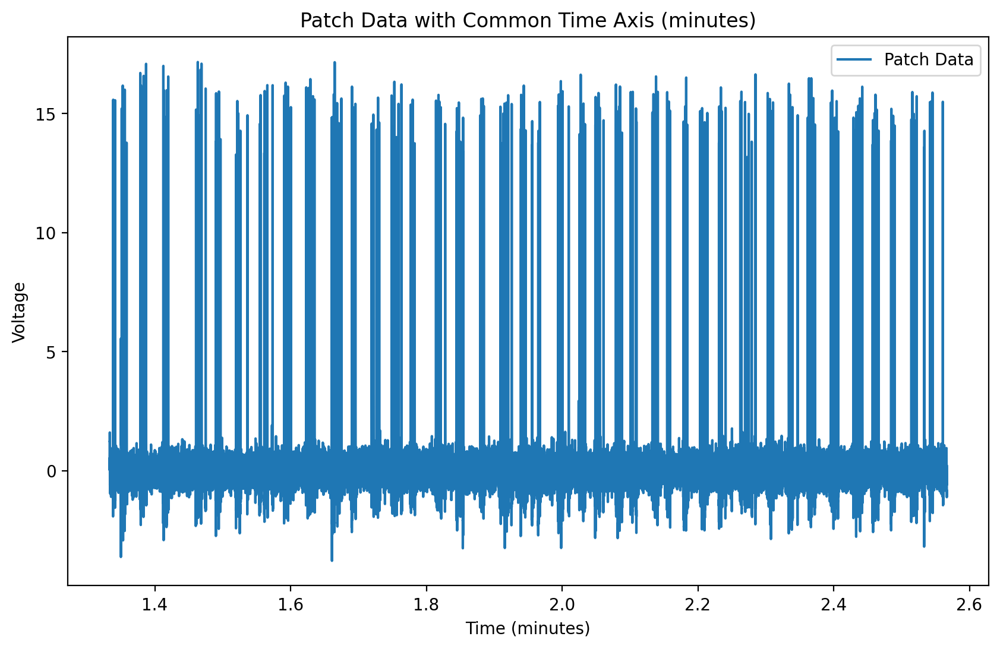

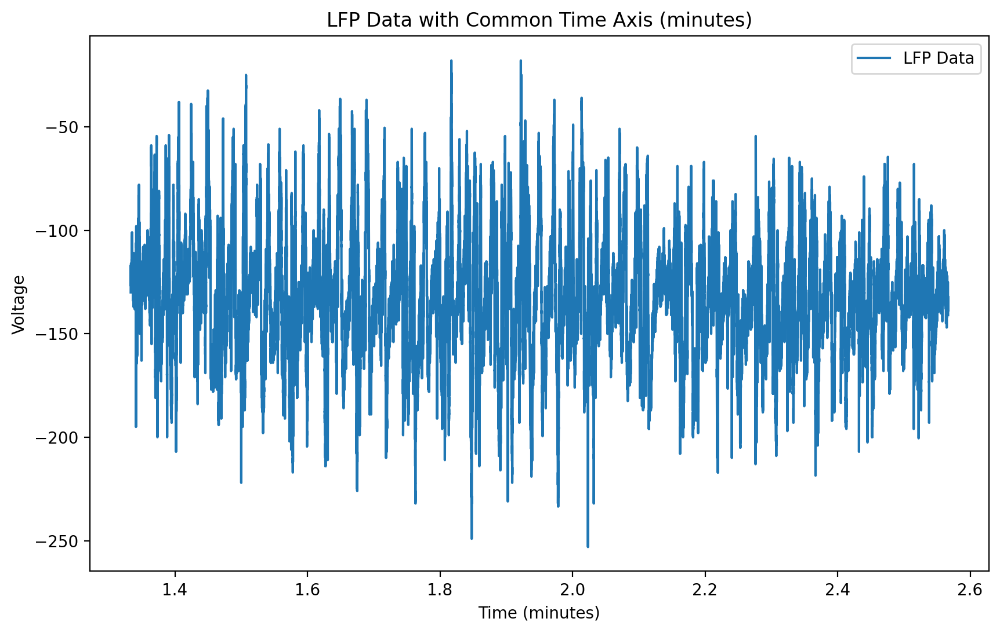

In [7]:
# Plot simultaneous patch and LFP data
# Convert time arrays to minutes
patch_times_min = patch_times / 60000  # Convert milliseconds to minutes
lfp_times_min = lfp_times / 60000  # Convert milliseconds to minutes

# Set the common time axis in minutes (e.g., from 13.3333 to 35.6667 minutes)
common_time_range_min = np.arange(80000 / 60000, 154000 / 60000, 1 / 60000)  # Adjust as needed

# Interpolate patch data onto the common time axis
patch_interp = np.interp(common_time_range_min, patch_times_min, patch_filt)

# Interpolate LFP data onto the common time axis
lfp_interp = np.interp(common_time_range_min, lfp_times_min, lfp_filt)

# Plot patch data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, patch_interp, label='Patch Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('Patch Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

# Plot LFP data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, lfp_interp, label='LFP Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('LFP Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

## STEP 1: Detect and fit spikes from patch data

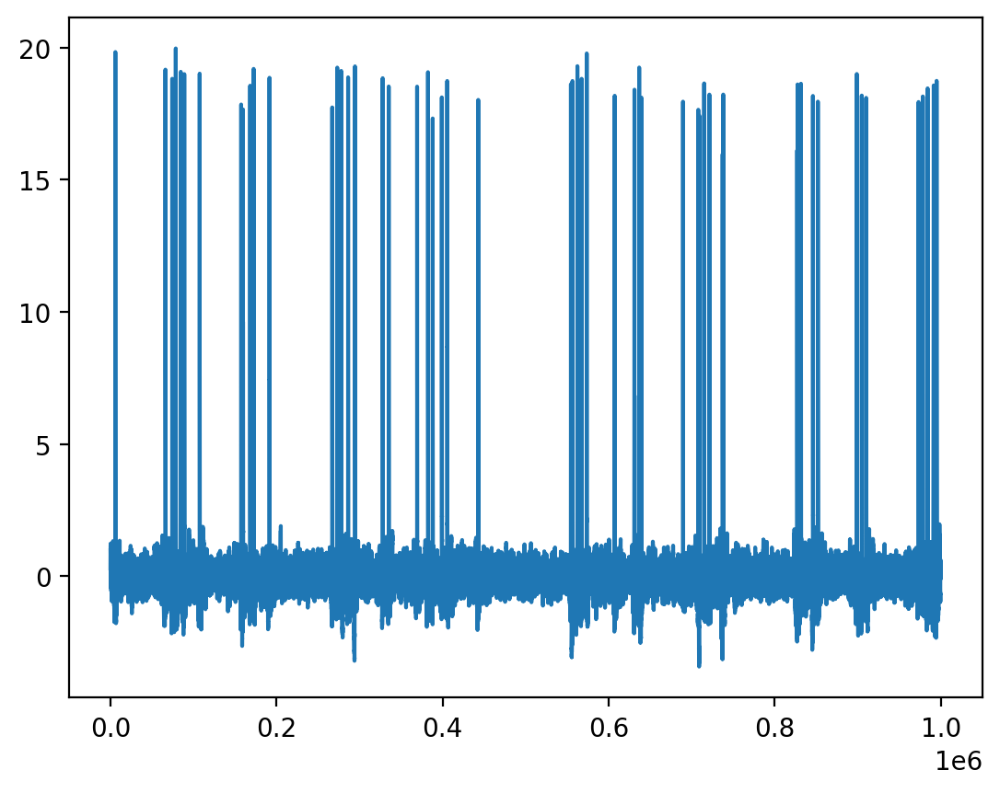

In [8]:
plt.plot(patch_filt[:1000000] )

In [9]:



#threshold in mVs
sp = Spike(thresh_amp=5, window_length=(5., 5.), smooth_frac=.01)

In [10]:

sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm, flip_signal=False)

Spike:   0%|          | 0/11873 [00:00<?, ?it/s]

Spike:   0%|          | 1/11873 [00:07<24:13:22,  7.35s/it]

Spike:   0%|          | 2/11873 [00:08<11:26:56,  3.47s/it]

Spike:   0%|          | 5/11873 [00:08<3:24:09,  1.03s/it] 

Spike:   0%|          | 6/11873 [00:08<2:38:07,  1.25it/s]

Spike:   0%|          | 48/11873 [00:08<10:19, 19.10it/s] 

Spike:   1%|          | 60/11873 [00:08<08:01, 24.51it/s]

Spike:   1%|          | 71/11873 [00:08<06:29, 30.28it/s]

Spike:   1%|          | 81/11873 [00:08<05:24, 36.38it/s]

Spike:   1%|          | 91/11873 [00:09<04:33, 43.14it/s]

Spike:   1%|          | 101/11873 [00:09<03:50, 51.15it/s]

Spike:   1%|          | 111/11873 [00:09<03:23, 57.92it/s]

Spike:   1%|          | 121/11873 [00:09<03:05, 63.31it/s]

Spike:   1%|          | 133/11873 [00:09<02:39, 73.55it/s]

Spike:   1%|          | 143/11873 [00:09<02:52, 68.15it/s]

Spike:   1%|▏         | 152/11873 [00:09<02:45, 70.67it/s]

Spike:   1%|▏         | 168/11873 [00:09<02:26, 79.93it/s]

Spike:   2%|▏         | 180/11873 [00:10<02:18, 84.23it/s]

Spike:   2%|▏         | 190/11873 [00:10<02:20, 83.41it/s]

Spike:   2%|▏         | 204/11873 [00:10<02:06, 92.51it/s]

Spike:   2%|▏         | 214/11873 [00:10<02:05, 93.03it/s]

Spike:   2%|▏         | 225/11873 [00:10<02:06, 92.11it/s]

Spike:   2%|▏         | 235/11873 [00:10<02:19, 83.70it/s]

Spike:   2%|▏         | 244/11873 [00:10<02:19, 83.34it/s]

Spike:   2%|▏         | 256/11873 [00:10<02:06, 91.57it/s]

Spike:   2%|▏         | 266/11873 [00:11<02:05, 92.47it/s]

Spike:   2%|▏         | 278/11873 [00:11<01:59, 97.38it/s]

Spike:   2%|▏         | 288/11873 [00:11<02:18, 83.83it/s]

Spike:   3%|▎         | 301/11873 [00:11<02:01, 95.21it/s]

Spike:   3%|▎         | 311/11873 [00:11<02:07, 90.60it/s]

Spike:   3%|▎         | 321/11873 [00:11<02:52, 67.10it/s]

Spike:   3%|▎         | 329/11873 [00:11<03:00, 63.87it/s]

Spike:   3%|▎         | 339/11873 [00:11<02:42, 70.88it/s]

Spike:   3%|▎         | 347/11873 [00:12<02:56, 65.29it/s]

Spike:   3%|▎         | 355/11873 [00:12<03:37, 52.99it/s]

Spike:   3%|▎         | 362/11873 [00:12<03:54, 49.19it/s]

Spike:   3%|▎         | 368/11873 [00:12<04:25, 43.41it/s]

Spike:   3%|▎         | 376/11873 [00:12<04:41, 40.85it/s]

Spike:   3%|▎         | 386/11873 [00:13<03:42, 51.58it/s]

Spike:   3%|▎         | 394/11873 [00:13<03:33, 53.71it/s]

Spike:   3%|▎         | 406/11873 [00:13<02:50, 67.38it/s]

Spike:   3%|▎         | 414/11873 [00:13<02:48, 67.89it/s]

Spike:   4%|▎         | 422/11873 [00:13<02:59, 63.63it/s]

Spike:   4%|▎         | 431/11873 [00:13<02:45, 68.95it/s]

Spike:   4%|▎         | 443/11873 [00:13<02:29, 76.58it/s]

Spike:   4%|▍         | 451/11873 [00:13<02:37, 72.62it/s]

Spike:   4%|▍         | 460/11873 [00:14<02:51, 66.57it/s]

Spike:   4%|▍         | 473/11873 [00:14<02:30, 75.82it/s]

Spike:   4%|▍         | 485/11873 [00:14<02:29, 76.16it/s]

Spike:   4%|▍         | 494/11873 [00:14<02:27, 77.19it/s]

Spike:   4%|▍         | 502/11873 [00:14<02:26, 77.84it/s]

Spike:   4%|▍         | 511/11873 [00:14<02:25, 78.22it/s]

Spike:   4%|▍         | 523/11873 [00:14<02:08, 88.37it/s]

Spike:   4%|▍         | 533/11873 [00:15<02:48, 67.43it/s]

Spike:   5%|▍         | 550/11873 [00:15<02:10, 86.88it/s]

Spike:   5%|▍         | 560/11873 [00:15<02:14, 84.16it/s]

Spike:   5%|▍         | 570/11873 [00:15<02:20, 80.26it/s]

Spike:   5%|▍         | 581/11873 [00:15<02:17, 82.37it/s]

Spike:   5%|▌         | 597/11873 [00:15<01:52, 100.06it/s]

Spike:   5%|▌         | 608/11873 [00:15<01:57, 95.64it/s] 

Spike:   5%|▌         | 618/11873 [00:15<01:59, 94.30it/s]

Spike:   5%|▌         | 629/11873 [00:15<01:56, 96.47it/s]

Spike:   5%|▌         | 641/11873 [00:16<01:55, 97.45it/s]

Spike:   5%|▌         | 651/11873 [00:16<01:56, 96.11it/s]

Spike:   6%|▌         | 662/11873 [00:16<02:12, 84.84it/s]

Spike:   6%|▌         | 677/11873 [00:16<01:54, 97.44it/s]

Spike:   6%|▌         | 688/11873 [00:16<01:58, 94.46it/s]

Spike:   6%|▌         | 702/11873 [00:16<01:49, 101.62it/s]

Spike:   6%|▌         | 713/11873 [00:16<01:58, 94.17it/s] 

Spike:   6%|▌         | 723/11873 [00:17<02:01, 91.66it/s]

Spike:   6%|▌         | 734/11873 [00:17<02:09, 86.32it/s]

Spike:   6%|▋         | 748/11873 [00:17<02:01, 91.84it/s]

Spike:   6%|▋         | 758/11873 [00:17<02:20, 79.20it/s]

Spike:   7%|▋         | 774/11873 [00:17<01:57, 94.22it/s]

Spike:   7%|▋         | 784/11873 [00:17<02:00, 91.79it/s]

Spike:   7%|▋         | 796/11873 [00:17<01:52, 98.25it/s]

Spike:   7%|▋         | 807/11873 [00:17<02:08, 86.03it/s]

Spike:   7%|▋         | 818/11873 [00:18<02:01, 90.86it/s]

Spike:   7%|▋         | 828/11873 [00:18<01:59, 92.72it/s]

Spike:   7%|▋         | 840/11873 [00:18<01:54, 96.55it/s]

Spike:   7%|▋         | 850/11873 [00:18<02:07, 86.52it/s]

Spike:   7%|▋         | 860/11873 [00:18<02:04, 88.66it/s]

Spike:   7%|▋         | 872/11873 [00:18<02:07, 86.03it/s]

Spike:   7%|▋         | 882/11873 [00:18<02:08, 85.79it/s]

Spike:   8%|▊         | 894/11873 [00:18<01:56, 93.92it/s]

Spike:   8%|▊         | 907/11873 [00:19<02:04, 88.02it/s]

Spike:   8%|▊         | 920/11873 [00:19<01:51, 98.05it/s]

Spike:   8%|▊         | 931/11873 [00:19<02:01, 89.79it/s]

Spike:   8%|▊         | 941/11873 [00:19<02:05, 87.15it/s]

Spike:   8%|▊         | 953/11873 [00:19<02:12, 82.34it/s]

Spike:   8%|▊         | 966/11873 [00:19<02:06, 85.97it/s]

Spike:   8%|▊         | 975/11873 [00:19<02:06, 86.16it/s]

Spike:   8%|▊         | 984/11873 [00:19<02:12, 81.89it/s]

Spike:   8%|▊         | 993/11873 [00:20<02:12, 82.12it/s]

Spike:   8%|▊         | 1002/11873 [00:20<02:17, 79.21it/s]

Spike:   9%|▊         | 1010/11873 [00:20<02:19, 77.78it/s]

Spike:   9%|▊         | 1020/11873 [00:20<02:22, 75.98it/s]

Spike:   9%|▊         | 1029/11873 [00:20<02:32, 71.21it/s]

Spike:   9%|▉         | 1045/11873 [00:20<01:57, 91.80it/s]

Spike:   9%|▉         | 1056/11873 [00:20<02:00, 89.81it/s]

Spike:   9%|▉         | 1066/11873 [00:20<02:02, 88.21it/s]

Spike:   9%|▉         | 1078/11873 [00:21<01:54, 94.31it/s]

Spike:   9%|▉         | 1088/11873 [00:21<01:58, 91.26it/s]

Spike:   9%|▉         | 1099/11873 [00:21<01:58, 91.21it/s]

Spike:   9%|▉         | 1109/11873 [00:21<01:57, 91.49it/s]

Spike:   9%|▉         | 1119/11873 [00:21<01:58, 91.07it/s]

Spike:  10%|▉         | 1129/11873 [00:21<01:57, 91.06it/s]

Spike:  10%|▉         | 1139/11873 [00:21<01:59, 89.75it/s]

Spike:  10%|▉         | 1148/11873 [00:21<01:59, 89.78it/s]

Spike:  10%|▉         | 1160/11873 [00:21<01:56, 91.58it/s]

Spike:  10%|▉         | 1171/11873 [00:22<02:06, 84.42it/s]

Spike:  10%|▉         | 1182/11873 [00:22<02:02, 87.25it/s]

Spike:  10%|█         | 1191/11873 [00:22<02:06, 84.66it/s]

Spike:  10%|█         | 1204/11873 [00:22<01:53, 93.98it/s]

Spike:  10%|█         | 1214/11873 [00:22<01:54, 93.35it/s]

Spike:  10%|█         | 1224/11873 [00:22<01:58, 89.80it/s]

Spike:  10%|█         | 1234/11873 [00:22<02:37, 67.70it/s]

Spike:  10%|█         | 1242/11873 [00:23<02:45, 64.08it/s]

Spike:  11%|█         | 1249/11873 [00:23<03:10, 55.88it/s]

Spike:  11%|█         | 1259/11873 [00:23<03:00, 58.94it/s]

Spike:  11%|█         | 1270/11873 [00:23<02:33, 68.96it/s]

Spike:  11%|█         | 1278/11873 [00:23<02:35, 68.30it/s]

Spike:  11%|█         | 1286/11873 [00:23<02:43, 64.83it/s]

Spike:  11%|█         | 1293/11873 [00:23<02:54, 60.62it/s]

Spike:  11%|█         | 1303/11873 [00:24<02:32, 69.45it/s]

Spike:  11%|█         | 1311/11873 [00:24<02:39, 66.38it/s]

Spike:  11%|█         | 1318/11873 [00:24<02:39, 66.12it/s]

Spike:  11%|█         | 1328/11873 [00:24<02:34, 68.37it/s]

Spike:  11%|█         | 1335/11873 [00:24<02:45, 63.76it/s]

Spike:  11%|█▏        | 1344/11873 [00:24<02:49, 62.04it/s]

Spike:  11%|█▏        | 1356/11873 [00:24<02:23, 73.21it/s]

Spike:  11%|█▏        | 1364/11873 [00:24<02:28, 70.59it/s]

Spike:  12%|█▏        | 1372/11873 [00:25<02:26, 71.49it/s]

Spike:  12%|█▏        | 1380/11873 [00:25<02:40, 65.26it/s]

Spike:  12%|█▏        | 1390/11873 [00:25<02:26, 71.46it/s]

Spike:  12%|█▏        | 1398/11873 [00:25<02:43, 64.21it/s]

Spike:  12%|█▏        | 1408/11873 [00:25<02:40, 65.31it/s]

Spike:  12%|█▏        | 1417/11873 [00:25<02:28, 70.57it/s]

Spike:  12%|█▏        | 1425/11873 [00:25<02:35, 67.01it/s]

Spike:  12%|█▏        | 1432/11873 [00:26<03:02, 57.17it/s]

Spike:  12%|█▏        | 1443/11873 [00:26<03:18, 52.64it/s]

Spike:  12%|█▏        | 1454/11873 [00:26<02:45, 62.96it/s]

Spike:  12%|█▏        | 1464/11873 [00:26<02:37, 66.09it/s]

Spike:  12%|█▏        | 1473/11873 [00:26<02:32, 68.23it/s]

Spike:  12%|█▏        | 1482/11873 [00:26<02:23, 72.60it/s]

Spike:  13%|█▎        | 1490/11873 [00:26<02:22, 72.89it/s]

Spike:  13%|█▎        | 1498/11873 [00:26<02:22, 72.85it/s]

Spike:  13%|█▎        | 1506/11873 [00:27<03:07, 55.29it/s]

Spike:  13%|█▎        | 1519/11873 [00:27<02:32, 67.82it/s]

Spike:  13%|█▎        | 1527/11873 [00:27<02:32, 67.81it/s]

Spike:  13%|█▎        | 1535/11873 [00:27<02:37, 65.50it/s]

Spike:  13%|█▎        | 1546/11873 [00:27<02:22, 72.62it/s]

Spike:  13%|█▎        | 1554/11873 [00:27<02:37, 65.68it/s]

Spike:  13%|█▎        | 1561/11873 [00:27<02:39, 64.59it/s]

Spike:  13%|█▎        | 1568/11873 [00:28<02:43, 62.87it/s]

Spike:  13%|█▎        | 1576/11873 [00:28<02:48, 61.07it/s]

Spike:  13%|█▎        | 1584/11873 [00:28<02:50, 60.35it/s]

Spike:  13%|█▎        | 1594/11873 [00:28<02:51, 60.07it/s]

Spike:  13%|█▎        | 1602/11873 [00:28<02:39, 64.55it/s]

Spike:  14%|█▎        | 1613/11873 [00:28<02:31, 67.85it/s]

Spike:  14%|█▎        | 1622/11873 [00:28<02:46, 61.39it/s]

Spike:  14%|█▎        | 1632/11873 [00:29<02:37, 65.03it/s]

Spike:  14%|█▍        | 1640/11873 [00:29<02:29, 68.32it/s]

Spike:  14%|█▍        | 1648/11873 [00:29<02:39, 64.07it/s]

Spike:  14%|█▍        | 1655/11873 [00:29<03:20, 50.85it/s]

Spike:  14%|█▍        | 1666/11873 [00:29<02:43, 62.35it/s]

Spike:  14%|█▍        | 1676/11873 [00:29<02:35, 65.65it/s]

Spike:  14%|█▍        | 1688/11873 [00:29<02:17, 74.08it/s]

Spike:  14%|█▍        | 1703/11873 [00:30<01:56, 87.42it/s]

Spike:  14%|█▍        | 1713/11873 [00:30<02:05, 80.98it/s]

Spike:  15%|█▍        | 1722/11873 [00:30<02:03, 82.10it/s]

Spike:  15%|█▍        | 1731/11873 [00:30<02:06, 80.09it/s]

Spike:  15%|█▍        | 1742/11873 [00:30<01:57, 86.02it/s]

Spike:  15%|█▍        | 1752/11873 [00:30<01:59, 85.00it/s]

Spike:  15%|█▍        | 1764/11873 [00:30<01:52, 90.13it/s]

Spike:  15%|█▍        | 1776/11873 [00:30<01:44, 96.83it/s]

Spike:  15%|█▌        | 1786/11873 [00:30<01:48, 92.90it/s]

Spike:  15%|█▌        | 1796/11873 [00:31<01:52, 89.96it/s]

Spike:  15%|█▌        | 1806/11873 [00:31<01:53, 88.79it/s]

Spike:  15%|█▌        | 1815/11873 [00:31<01:57, 85.35it/s]

Spike:  15%|█▌        | 1828/11873 [00:31<01:45, 95.38it/s]

Spike:  15%|█▌        | 1840/11873 [00:31<01:40, 99.61it/s]

Spike:  16%|█▌        | 1851/11873 [00:31<01:49, 91.78it/s]

Spike:  16%|█▌        | 1861/11873 [00:31<01:59, 83.82it/s]

Spike:  16%|█▌        | 1873/11873 [00:31<01:49, 91.66it/s]

Spike:  16%|█▌        | 1886/11873 [00:32<01:45, 94.92it/s]

Spike:  16%|█▌        | 1898/11873 [00:32<01:43, 96.78it/s]

Spike:  16%|█▌        | 1910/11873 [00:32<01:42, 97.21it/s]

Spike:  16%|█▌        | 1922/11873 [00:32<01:36, 102.98it/s]

Spike:  16%|█▋        | 1933/11873 [00:32<01:41, 98.25it/s] 

Spike:  16%|█▋        | 1943/11873 [00:32<01:48, 91.72it/s]

Spike:  16%|█▋        | 1955/11873 [00:32<01:44, 95.13it/s]

Spike:  17%|█▋        | 1965/11873 [00:32<01:47, 91.86it/s]

Spike:  17%|█▋        | 1975/11873 [00:32<01:50, 89.27it/s]

Spike:  17%|█▋        | 1986/11873 [00:33<01:50, 89.39it/s]

Spike:  17%|█▋        | 1997/11873 [00:33<01:47, 91.83it/s]

Spike:  17%|█▋        | 2011/11873 [00:33<01:40, 98.34it/s]

Spike:  17%|█▋        | 2021/11873 [00:33<01:58, 82.91it/s]

Spike:  17%|█▋        | 2030/11873 [00:33<02:07, 77.07it/s]

Spike:  17%|█▋        | 2045/11873 [00:33<01:53, 86.38it/s]

Spike:  17%|█▋        | 2054/11873 [00:33<01:54, 85.66it/s]

Spike:  17%|█▋        | 2065/11873 [00:34<01:55, 84.65it/s]

Spike:  17%|█▋        | 2077/11873 [00:34<01:48, 90.37it/s]

Spike:  18%|█▊        | 2087/11873 [00:34<02:06, 77.63it/s]

Spike:  18%|█▊        | 2096/11873 [00:34<02:11, 74.34it/s]

Spike:  18%|█▊        | 2104/11873 [00:34<02:22, 68.73it/s]

Spike:  18%|█▊        | 2112/11873 [00:34<02:19, 69.98it/s]

Spike:  18%|█▊        | 2124/11873 [00:34<01:59, 81.35it/s]

Spike:  18%|█▊        | 2133/11873 [00:34<01:58, 82.41it/s]

Spike:  18%|█▊        | 2142/11873 [00:35<02:07, 76.30it/s]

Spike:  18%|█▊        | 2151/11873 [00:35<02:14, 72.47it/s]

Spike:  18%|█▊        | 2160/11873 [00:35<02:13, 72.99it/s]

Spike:  18%|█▊        | 2174/11873 [00:35<02:02, 79.31it/s]

Spike:  18%|█▊        | 2185/11873 [00:35<01:59, 81.40it/s]

Spike:  18%|█▊        | 2194/11873 [00:35<02:01, 79.87it/s]

Spike:  19%|█▊        | 2202/11873 [00:35<02:22, 67.76it/s]

Spike:  19%|█▊        | 2209/11873 [00:36<02:22, 68.04it/s]

Spike:  19%|█▊        | 2216/11873 [00:36<03:07, 51.49it/s]

Spike:  19%|█▉        | 2228/11873 [00:36<02:48, 57.25it/s]

Spike:  19%|█▉        | 2236/11873 [00:36<02:38, 60.82it/s]

Spike:  19%|█▉        | 2245/11873 [00:36<02:27, 65.41it/s]

Spike:  19%|█▉        | 2256/11873 [00:36<02:10, 73.65it/s]

Spike:  19%|█▉        | 2264/11873 [00:36<02:09, 74.11it/s]

Spike:  19%|█▉        | 2272/11873 [00:36<02:14, 71.31it/s]

Spike:  19%|█▉        | 2280/11873 [00:37<02:13, 71.97it/s]

Spike:  19%|█▉        | 2292/11873 [00:37<01:56, 82.47it/s]

Spike:  19%|█▉        | 2301/11873 [00:37<02:01, 78.59it/s]

Spike:  19%|█▉        | 2309/11873 [00:37<02:06, 75.83it/s]

Spike:  20%|█▉        | 2317/11873 [00:37<02:05, 76.43it/s]

Spike:  20%|█▉        | 2325/11873 [00:37<02:14, 71.14it/s]

Spike:  20%|█▉        | 2333/11873 [00:37<02:15, 70.25it/s]

Spike:  20%|█▉        | 2341/11873 [00:37<02:28, 64.11it/s]

Spike:  20%|█▉        | 2348/11873 [00:38<02:44, 57.87it/s]

Spike:  20%|█▉        | 2359/11873 [00:38<02:21, 67.30it/s]

Spike:  20%|█▉        | 2369/11873 [00:38<02:11, 72.20it/s]

Spike:  20%|██        | 2377/11873 [00:38<02:09, 73.16it/s]

Spike:  20%|██        | 2386/11873 [00:38<02:15, 69.90it/s]

Spike:  20%|██        | 2395/11873 [00:38<02:13, 71.06it/s]

Spike:  20%|██        | 2407/11873 [00:38<01:59, 79.22it/s]

Spike:  20%|██        | 2416/11873 [00:38<02:09, 73.00it/s]

Spike:  20%|██        | 2429/11873 [00:39<01:56, 81.16it/s]

Spike:  21%|██        | 2441/11873 [00:39<01:52, 83.86it/s]

Spike:  21%|██        | 2450/11873 [00:39<02:05, 75.16it/s]

Spike:  21%|██        | 2458/11873 [00:39<02:16, 68.93it/s]

Spike:  21%|██        | 2467/11873 [00:39<02:19, 67.33it/s]

Spike:  21%|██        | 2476/11873 [00:39<02:16, 68.85it/s]

Spike:  21%|██        | 2487/11873 [00:39<02:07, 73.79it/s]

Spike:  21%|██        | 2497/11873 [00:40<02:00, 77.77it/s]

Spike:  21%|██        | 2507/11873 [00:40<01:57, 79.52it/s]

Spike:  21%|██        | 2517/11873 [00:40<01:57, 79.42it/s]

Spike:  21%|██▏       | 2527/11873 [00:40<01:51, 83.67it/s]

Spike:  21%|██▏       | 2536/11873 [00:40<01:56, 80.02it/s]

Spike:  21%|██▏       | 2545/11873 [00:40<01:56, 80.33it/s]

Spike:  22%|██▏       | 2559/11873 [00:40<01:39, 94.04it/s]

Spike:  22%|██▏       | 2569/11873 [00:40<01:50, 84.13it/s]

Spike:  22%|██▏       | 2579/11873 [00:40<01:45, 87.72it/s]

Spike:  22%|██▏       | 2591/11873 [00:41<01:43, 89.92it/s]

Spike:  22%|██▏       | 2602/11873 [00:41<01:37, 94.92it/s]

Spike:  22%|██▏       | 2612/11873 [00:41<01:49, 84.58it/s]

Spike:  22%|██▏       | 2622/11873 [00:41<01:55, 79.92it/s]

Spike:  22%|██▏       | 2634/11873 [00:41<01:47, 85.74it/s]

Spike:  22%|██▏       | 2644/11873 [00:41<01:51, 83.02it/s]

Spike:  22%|██▏       | 2657/11873 [00:41<01:39, 92.41it/s]

Spike:  22%|██▏       | 2668/11873 [00:42<01:50, 83.23it/s]

Spike:  23%|██▎       | 2680/11873 [00:42<01:40, 91.41it/s]

Spike:  23%|██▎       | 2692/11873 [00:42<01:34, 97.06it/s]

Spike:  23%|██▎       | 2703/11873 [00:42<01:37, 94.31it/s]

Spike:  23%|██▎       | 2713/11873 [00:42<01:38, 92.98it/s]

Spike:  23%|██▎       | 2723/11873 [00:42<02:04, 73.59it/s]

Spike:  23%|██▎       | 2733/11873 [00:42<01:55, 79.23it/s]

Spike:  23%|██▎       | 2745/11873 [00:42<01:49, 83.20it/s]

Spike:  23%|██▎       | 2755/11873 [00:43<01:51, 81.91it/s]

Spike:  23%|██▎       | 2764/11873 [00:43<01:48, 83.67it/s]

Spike:  23%|██▎       | 2774/11873 [00:43<01:44, 86.86it/s]

Spike:  23%|██▎       | 2786/11873 [00:43<01:43, 87.76it/s]

Spike:  24%|██▎       | 2797/11873 [00:43<01:38, 92.60it/s]

Spike:  24%|██▎       | 2809/11873 [00:43<01:30, 99.74it/s]

Spike:  24%|██▍       | 2820/11873 [00:43<01:30, 100.16it/s]

Spike:  24%|██▍       | 2831/11873 [00:43<01:45, 85.39it/s] 

Spike:  24%|██▍       | 2845/11873 [00:44<01:40, 89.76it/s]

Spike:  24%|██▍       | 2855/11873 [00:44<01:41, 88.73it/s]

Spike:  24%|██▍       | 2867/11873 [00:44<01:37, 91.92it/s]

Spike:  24%|██▍       | 2879/11873 [00:44<01:49, 82.17it/s]

Spike:  24%|██▍       | 2891/11873 [00:44<01:41, 88.66it/s]

Spike:  24%|██▍       | 2902/11873 [00:44<01:48, 82.73it/s]

Spike:  25%|██▍       | 2913/11873 [00:44<01:41, 88.41it/s]

Spike:  25%|██▍       | 2923/11873 [00:44<01:50, 80.81it/s]

Spike:  25%|██▍       | 2942/11873 [00:45<01:29, 99.87it/s]

Spike:  25%|██▍       | 2953/11873 [00:45<01:34, 94.18it/s]

Spike:  25%|██▍       | 2963/11873 [00:45<01:41, 87.95it/s]

Spike:  25%|██▌       | 2972/11873 [00:45<01:46, 83.39it/s]

Spike:  25%|██▌       | 2984/11873 [00:45<01:47, 82.43it/s]

Spike:  25%|██▌       | 2993/11873 [00:45<01:46, 83.60it/s]

Spike:  25%|██▌       | 3002/11873 [00:45<01:46, 83.44it/s]

Spike:  25%|██▌       | 3011/11873 [00:45<01:47, 82.42it/s]

Spike:  25%|██▌       | 3024/11873 [00:46<01:40, 88.21it/s]

Spike:  26%|██▌       | 3036/11873 [00:46<01:34, 93.18it/s]

Spike:  26%|██▌       | 3046/11873 [00:46<01:46, 82.82it/s]

Spike:  26%|██▌       | 3055/11873 [00:46<01:55, 76.63it/s]

Spike:  26%|██▌       | 3065/11873 [00:46<01:52, 78.50it/s]

Spike:  26%|██▌       | 3082/11873 [00:46<01:37, 90.40it/s]

Spike:  26%|██▌       | 3093/11873 [00:46<01:33, 94.16it/s]

Spike:  26%|██▌       | 3103/11873 [00:46<01:33, 94.09it/s]

Spike:  26%|██▌       | 3113/11873 [00:47<01:32, 94.80it/s]

Spike:  26%|██▋       | 3123/11873 [00:47<01:39, 88.02it/s]

Spike:  26%|██▋       | 3136/11873 [00:47<01:34, 92.43it/s]

Spike:  26%|██▋       | 3146/11873 [00:47<01:32, 94.01it/s]

Spike:  27%|██▋       | 3156/11873 [00:47<01:42, 85.21it/s]

Spike:  27%|██▋       | 3165/11873 [00:47<02:20, 61.82it/s]

Spike:  27%|██▋       | 3173/11873 [00:47<02:21, 61.58it/s]

Spike:  27%|██▋       | 3180/11873 [00:48<02:33, 56.62it/s]

Spike:  27%|██▋       | 3189/11873 [00:48<02:18, 62.68it/s]

Spike:  27%|██▋       | 3199/11873 [00:48<02:02, 70.82it/s]

Spike:  27%|██▋       | 3210/11873 [00:48<01:56, 74.53it/s]

Spike:  27%|██▋       | 3219/11873 [00:48<01:55, 74.61it/s]

Spike:  27%|██▋       | 3228/11873 [00:48<01:58, 72.83it/s]

Spike:  27%|██▋       | 3241/11873 [00:48<01:43, 83.63it/s]

Spike:  27%|██▋       | 3250/11873 [00:48<01:44, 82.49it/s]

Spike:  27%|██▋       | 3262/11873 [00:49<01:43, 82.84it/s]

Spike:  28%|██▊       | 3272/11873 [00:49<01:40, 85.89it/s]

Spike:  28%|██▊       | 3282/11873 [00:49<01:38, 87.18it/s]

Spike:  28%|██▊       | 3291/11873 [00:49<01:42, 83.33it/s]

Spike:  28%|██▊       | 3303/11873 [00:49<01:43, 82.89it/s]

Spike:  28%|██▊       | 3312/11873 [00:49<01:43, 82.58it/s]

Spike:  28%|██▊       | 3321/11873 [00:49<01:45, 81.15it/s]

Spike:  28%|██▊       | 3335/11873 [00:49<01:35, 89.75it/s]

Spike:  28%|██▊       | 3344/11873 [00:50<01:47, 79.67it/s]

Spike:  28%|██▊       | 3357/11873 [00:50<01:33, 90.87it/s]

Spike:  28%|██▊       | 3367/11873 [00:50<01:46, 80.17it/s]

Spike:  28%|██▊       | 3376/11873 [00:50<02:11, 64.65it/s]

Spike:  29%|██▊       | 3384/11873 [00:50<02:14, 62.97it/s]

Spike:  29%|██▊       | 3391/11873 [00:50<03:00, 46.86it/s]

Spike:  29%|██▊       | 3400/11873 [00:51<02:46, 50.93it/s]

Spike:  29%|██▊       | 3410/11873 [00:51<02:20, 60.34it/s]

Spike:  29%|██▉       | 3418/11873 [00:51<02:16, 62.16it/s]

Spike:  29%|██▉       | 3432/11873 [00:51<01:48, 77.58it/s]

Spike:  29%|██▉       | 3441/11873 [00:51<01:54, 73.79it/s]

Spike:  29%|██▉       | 3450/11873 [00:51<01:56, 72.49it/s]

Spike:  29%|██▉       | 3461/11873 [00:51<01:48, 77.65it/s]

Spike:  29%|██▉       | 3473/11873 [00:51<01:41, 82.85it/s]

Spike:  29%|██▉       | 3482/11873 [00:52<01:45, 79.67it/s]

Spike:  29%|██▉       | 3491/11873 [00:52<01:52, 74.54it/s]

Spike:  29%|██▉       | 3502/11873 [00:52<01:52, 74.63it/s]

Spike:  30%|██▉       | 3510/11873 [00:52<01:50, 75.53it/s]

Spike:  30%|██▉       | 3524/11873 [00:52<01:36, 86.26it/s]

Spike:  30%|██▉       | 3534/11873 [00:52<01:34, 88.47it/s]

Spike:  30%|██▉       | 3545/11873 [00:52<01:41, 82.30it/s]

Spike:  30%|██▉       | 3559/11873 [00:53<01:33, 88.57it/s]

Spike:  30%|███       | 3569/11873 [00:53<01:36, 86.14it/s]

Spike:  30%|███       | 3582/11873 [00:53<01:26, 95.37it/s]

Spike:  30%|███       | 3592/11873 [00:53<01:28, 93.62it/s]

Spike:  30%|███       | 3602/11873 [00:53<01:33, 88.83it/s]

Spike:  30%|███       | 3611/11873 [00:53<01:32, 88.85it/s]

Spike:  30%|███       | 3620/11873 [00:53<01:41, 81.02it/s]

Spike:  31%|███       | 3629/11873 [00:53<01:48, 76.01it/s]

Spike:  31%|███       | 3638/11873 [00:53<01:48, 76.09it/s]

Spike:  31%|███       | 3646/11873 [00:54<01:53, 72.43it/s]

Spike:  31%|███       | 3654/11873 [00:54<02:12, 62.13it/s]

Spike:  31%|███       | 3666/11873 [00:54<01:54, 71.45it/s]

Spike:  31%|███       | 3677/11873 [00:54<01:44, 78.64it/s]

Spike:  31%|███       | 3686/11873 [00:54<01:40, 81.30it/s]

Spike:  31%|███       | 3695/11873 [00:54<01:37, 83.50it/s]

Spike:  31%|███       | 3704/11873 [00:54<01:40, 81.05it/s]

Spike:  31%|███▏      | 3713/11873 [00:54<01:48, 75.39it/s]

Spike:  31%|███▏      | 3721/11873 [00:55<02:06, 64.26it/s]

Spike:  31%|███▏      | 3728/11873 [00:55<02:05, 64.92it/s]

Spike:  31%|███▏      | 3736/11873 [00:55<02:18, 58.63it/s]

Spike:  32%|███▏      | 3753/11873 [00:55<01:39, 81.92it/s]

Spike:  32%|███▏      | 3762/11873 [00:55<01:38, 82.74it/s]

Spike:  32%|███▏      | 3772/11873 [00:55<01:41, 79.71it/s]

Spike:  32%|███▏      | 3786/11873 [00:55<01:33, 86.12it/s]

Spike:  32%|███▏      | 3797/11873 [00:56<01:29, 89.83it/s]

Spike:  32%|███▏      | 3807/11873 [00:56<01:28, 91.55it/s]

Spike:  32%|███▏      | 3817/11873 [00:56<01:28, 90.98it/s]

Spike:  32%|███▏      | 3827/11873 [00:56<01:39, 80.93it/s]

Spike:  32%|███▏      | 3839/11873 [00:56<01:28, 90.31it/s]

Spike:  32%|███▏      | 3849/11873 [00:56<01:32, 87.11it/s]

Spike:  33%|███▎      | 3860/11873 [00:56<01:26, 92.77it/s]

Spike:  33%|███▎      | 3872/11873 [00:56<01:29, 89.07it/s]

Spike:  33%|███▎      | 3882/11873 [00:56<01:29, 89.06it/s]

Spike:  33%|███▎      | 3892/11873 [00:57<01:29, 89.66it/s]

Spike:  33%|███▎      | 3902/11873 [00:57<01:33, 85.56it/s]

Spike:  33%|███▎      | 3912/11873 [00:57<01:35, 83.71it/s]

Spike:  33%|███▎      | 3922/11873 [00:57<01:31, 87.30it/s]

Spike:  33%|███▎      | 3931/11873 [00:57<01:30, 87.86it/s]

Spike:  33%|███▎      | 3940/11873 [00:57<01:35, 82.93it/s]

Spike:  33%|███▎      | 3949/11873 [00:57<01:44, 75.92it/s]

Spike:  33%|███▎      | 3957/11873 [00:57<01:49, 72.03it/s]

Spike:  33%|███▎      | 3965/11873 [00:58<01:59, 66.15it/s]

Spike:  33%|███▎      | 3974/11873 [00:58<01:52, 70.05it/s]

Spike:  34%|███▎      | 3983/11873 [00:58<01:48, 72.98it/s]

Spike:  34%|███▎      | 3994/11873 [00:58<01:43, 76.23it/s]

Spike:  34%|███▎      | 4003/11873 [00:58<01:40, 78.46it/s]

Spike:  34%|███▍      | 4011/11873 [00:58<01:56, 67.35it/s]

Spike:  34%|███▍      | 4019/11873 [00:58<02:13, 58.87it/s]

Spike:  34%|███▍      | 4027/11873 [00:59<02:13, 58.73it/s]

Spike:  34%|███▍      | 4037/11873 [00:59<02:01, 64.67it/s]

Spike:  34%|███▍      | 4052/11873 [00:59<01:45, 74.23it/s]

Spike:  34%|███▍      | 4060/11873 [00:59<01:44, 74.76it/s]

Spike:  34%|███▍      | 4072/11873 [00:59<01:32, 84.54it/s]

Spike:  34%|███▍      | 4085/11873 [00:59<01:32, 84.62it/s]

Spike:  35%|███▍      | 4098/11873 [00:59<01:23, 93.25it/s]

Spike:  35%|███▍      | 4108/11873 [00:59<01:38, 79.06it/s]

Spike:  35%|███▍      | 4117/11873 [01:00<01:40, 77.04it/s]

Spike:  35%|███▍      | 4129/11873 [01:00<01:30, 85.27it/s]

Spike:  35%|███▍      | 4138/11873 [01:00<01:34, 81.43it/s]

Spike:  35%|███▍      | 4150/11873 [01:00<01:28, 86.96it/s]

Spike:  35%|███▌      | 4159/11873 [01:00<01:29, 85.81it/s]

Spike:  35%|███▌      | 4168/11873 [01:00<01:59, 64.34it/s]

Spike:  35%|███▌      | 4180/11873 [01:00<01:44, 73.54it/s]

Spike:  35%|███▌      | 4189/11873 [01:01<01:57, 65.36it/s]

Spike:  35%|███▌      | 4197/11873 [01:01<02:07, 60.23it/s]

Spike:  35%|███▌      | 4204/11873 [01:01<02:07, 60.31it/s]

Spike:  35%|███▌      | 4214/11873 [01:01<01:52, 68.25it/s]

Spike:  36%|███▌      | 4222/11873 [01:01<02:05, 61.08it/s]

Spike:  36%|███▌      | 4231/11873 [01:01<01:57, 64.85it/s]

Spike:  36%|███▌      | 4242/11873 [01:01<01:40, 75.58it/s]

Spike:  36%|███▌      | 4251/11873 [01:02<01:44, 73.23it/s]

Spike:  36%|███▌      | 4259/11873 [01:02<01:45, 72.10it/s]

Spike:  36%|███▌      | 4268/11873 [01:02<01:54, 66.54it/s]

Spike:  36%|███▌      | 4277/11873 [01:02<01:45, 71.95it/s]

Spike:  36%|███▌      | 4291/11873 [01:02<01:27, 86.32it/s]

Spike:  36%|███▌      | 4300/11873 [01:02<01:41, 74.96it/s]

Spike:  36%|███▋      | 4308/11873 [01:02<01:40, 75.36it/s]

Spike:  36%|███▋      | 4316/11873 [01:02<01:43, 72.79it/s]

Spike:  36%|███▋      | 4324/11873 [01:02<01:42, 73.99it/s]

Spike:  36%|███▋      | 4333/11873 [01:03<01:39, 75.62it/s]

Spike:  37%|███▋      | 4341/11873 [01:03<01:41, 74.48it/s]

Spike:  37%|███▋      | 4349/11873 [01:03<01:39, 75.46it/s]

Spike:  37%|███▋      | 4358/11873 [01:03<01:51, 67.63it/s]

Spike:  37%|███▋      | 4366/11873 [01:03<01:52, 66.85it/s]

Spike:  37%|███▋      | 4383/11873 [01:03<01:21, 92.44it/s]

Spike:  37%|███▋      | 4396/11873 [01:03<01:16, 97.28it/s]

Spike:  37%|███▋      | 4407/11873 [01:03<01:28, 84.65it/s]

Spike:  37%|███▋      | 4418/11873 [01:04<01:29, 82.85it/s]

Spike:  37%|███▋      | 4431/11873 [01:04<01:21, 91.29it/s]

Spike:  37%|███▋      | 4441/11873 [01:04<01:26, 86.33it/s]

Spike:  38%|███▊      | 4455/11873 [01:04<01:17, 96.16it/s]

Spike:  38%|███▊      | 4466/11873 [01:04<01:23, 88.27it/s]

Spike:  38%|███▊      | 4478/11873 [01:04<01:19, 92.68it/s]

Spike:  38%|███▊      | 4488/11873 [01:04<01:23, 88.51it/s]

Spike:  38%|███▊      | 4500/11873 [01:05<01:20, 92.04it/s]

Spike:  38%|███▊      | 4514/11873 [01:05<01:17, 95.05it/s]

Spike:  38%|███▊      | 4525/11873 [01:05<01:15, 96.84it/s]

Spike:  38%|███▊      | 4535/11873 [01:05<01:16, 95.40it/s]

Spike:  38%|███▊      | 4546/11873 [01:05<01:13, 99.02it/s]

Spike:  38%|███▊      | 4561/11873 [01:05<01:13, 99.77it/s]

Spike:  39%|███▊      | 4572/11873 [01:05<01:12, 100.58it/s]

Spike:  39%|███▊      | 4583/11873 [01:05<01:16, 95.52it/s] 

Spike:  39%|███▊      | 4594/11873 [01:05<01:14, 98.09it/s]

Spike:  39%|███▉      | 4605/11873 [01:06<01:12, 100.52it/s]

Spike:  39%|███▉      | 4616/11873 [01:06<01:21, 89.17it/s] 

Spike:  39%|███▉      | 4626/11873 [01:06<01:25, 84.27it/s]

Spike:  39%|███▉      | 4637/11873 [01:06<01:23, 86.82it/s]

Spike:  39%|███▉      | 4648/11873 [01:06<01:18, 91.66it/s]

Spike:  39%|███▉      | 4658/11873 [01:06<01:20, 89.24it/s]

Spike:  39%|███▉      | 4668/11873 [01:06<01:27, 82.01it/s]

Spike:  39%|███▉      | 4680/11873 [01:06<01:26, 83.33it/s]

Spike:  40%|███▉      | 4693/11873 [01:07<01:16, 94.29it/s]

Spike:  40%|███▉      | 4703/11873 [01:07<01:17, 92.69it/s]

Spike:  40%|███▉      | 4713/11873 [01:07<01:23, 85.77it/s]

Spike:  40%|███▉      | 4722/11873 [01:07<01:27, 81.99it/s]

Spike:  40%|███▉      | 4731/11873 [01:07<01:50, 64.52it/s]

Spike:  40%|███▉      | 4740/11873 [01:07<01:43, 68.98it/s]

Spike:  40%|███▉      | 4748/11873 [01:07<01:54, 62.05it/s]

Spike:  40%|████      | 4755/11873 [01:08<01:55, 61.85it/s]

Spike:  40%|████      | 4762/11873 [01:08<02:14, 52.92it/s]

Spike:  40%|████      | 4770/11873 [01:08<02:10, 54.35it/s]

Spike:  40%|████      | 4780/11873 [01:08<01:53, 62.49it/s]

Spike:  40%|████      | 4787/11873 [01:08<01:54, 61.85it/s]

Spike:  40%|████      | 4794/11873 [01:08<01:52, 63.08it/s]

Spike:  40%|████      | 4803/11873 [01:08<01:43, 68.13it/s]

Spike:  41%|████      | 4811/11873 [01:08<01:46, 66.57it/s]

Spike:  41%|████      | 4822/11873 [01:09<01:30, 77.52it/s]

Spike:  41%|████      | 4831/11873 [01:09<01:27, 80.26it/s]

Spike:  41%|████      | 4840/11873 [01:09<01:35, 73.41it/s]

Spike:  41%|████      | 4848/11873 [01:09<01:38, 71.15it/s]

Spike:  41%|████      | 4860/11873 [01:09<01:29, 78.19it/s]

Spike:  41%|████      | 4868/11873 [01:09<01:31, 76.57it/s]

Spike:  41%|████      | 4879/11873 [01:09<01:40, 69.30it/s]

Spike:  41%|████▏     | 4898/11873 [01:09<01:17, 89.84it/s]

Spike:  41%|████▏     | 4908/11873 [01:10<01:19, 88.09it/s]

Spike:  41%|████▏     | 4922/11873 [01:10<01:19, 87.44it/s]

Spike:  42%|████▏     | 4934/11873 [01:10<01:13, 93.86it/s]

Spike:  42%|████▏     | 4947/11873 [01:10<01:09, 99.56it/s]

Spike:  42%|████▏     | 4958/11873 [01:10<01:11, 96.22it/s]

Spike:  42%|████▏     | 4968/11873 [01:10<01:14, 92.73it/s]

Spike:  42%|████▏     | 4981/11873 [01:10<01:13, 93.78it/s]

Spike:  42%|████▏     | 4991/11873 [01:10<01:16, 89.93it/s]

Spike:  42%|████▏     | 5001/11873 [01:11<01:16, 90.14it/s]

Spike:  42%|████▏     | 5011/11873 [01:11<01:24, 80.81it/s]

Spike:  42%|████▏     | 5026/11873 [01:11<01:11, 95.19it/s]

Spike:  42%|████▏     | 5037/11873 [01:11<01:12, 94.55it/s]

Spike:  43%|████▎     | 5047/11873 [01:11<01:14, 92.02it/s]

Spike:  43%|████▎     | 5059/11873 [01:11<01:09, 98.35it/s]

Spike:  43%|████▎     | 5070/11873 [01:11<01:20, 84.65it/s]

Spike:  43%|████▎     | 5086/11873 [01:12<01:16, 88.40it/s]

Spike:  43%|████▎     | 5098/11873 [01:12<01:12, 93.54it/s]

Spike:  43%|████▎     | 5109/11873 [01:12<01:10, 95.93it/s]

Spike:  43%|████▎     | 5121/11873 [01:12<01:09, 96.70it/s]

Spike:  43%|████▎     | 5131/11873 [01:12<01:09, 96.59it/s]

Spike:  43%|████▎     | 5141/11873 [01:12<01:09, 96.74it/s]

Spike:  43%|████▎     | 5151/11873 [01:12<01:12, 92.74it/s]

Spike:  43%|████▎     | 5161/11873 [01:12<01:14, 90.40it/s]

Spike:  44%|████▎     | 5171/11873 [01:12<01:16, 87.48it/s]

Spike:  44%|████▎     | 5183/11873 [01:13<01:16, 87.86it/s]

Spike:  44%|████▎     | 5193/11873 [01:13<01:14, 89.97it/s]

Spike:  44%|████▍     | 5205/11873 [01:13<01:09, 95.73it/s]

Spike:  44%|████▍     | 5215/11873 [01:13<01:10, 94.07it/s]

Spike:  44%|████▍     | 5225/11873 [01:13<01:09, 95.31it/s]

Spike:  44%|████▍     | 5235/11873 [01:13<01:11, 92.22it/s]

Spike:  44%|████▍     | 5245/11873 [01:13<01:12, 91.27it/s]

Spike:  44%|████▍     | 5255/11873 [01:13<01:16, 86.98it/s]

Spike:  44%|████▍     | 5266/11873 [01:13<01:11, 92.06it/s]

Spike:  44%|████▍     | 5278/11873 [01:14<01:07, 97.91it/s]

Spike:  45%|████▍     | 5288/11873 [01:14<01:07, 97.64it/s]

Spike:  45%|████▍     | 5298/11873 [01:14<01:14, 88.24it/s]

Spike:  45%|████▍     | 5312/11873 [01:14<01:09, 93.77it/s]

Spike:  45%|████▍     | 5327/11873 [01:14<01:08, 96.20it/s]

Spike:  45%|████▍     | 5337/11873 [01:14<01:09, 93.47it/s]

Spike:  45%|████▌     | 5349/11873 [01:14<01:06, 98.01it/s]

Spike:  45%|████▌     | 5359/11873 [01:14<01:07, 96.00it/s]

Spike:  45%|████▌     | 5370/11873 [01:15<01:10, 92.72it/s]

Spike:  45%|████▌     | 5381/11873 [01:15<01:09, 93.00it/s]

Spike:  45%|████▌     | 5392/11873 [01:15<01:09, 92.69it/s]

Spike:  46%|████▌     | 5405/11873 [01:15<01:12, 89.45it/s]

Spike:  46%|████▌     | 5417/11873 [01:15<01:07, 95.90it/s]

Spike:  46%|████▌     | 5430/11873 [01:15<01:06, 97.42it/s]

Spike:  46%|████▌     | 5444/11873 [01:15<01:01, 104.45it/s]

Spike:  46%|████▌     | 5455/11873 [01:15<01:09, 92.37it/s] 

Spike:  46%|████▌     | 5465/11873 [01:16<01:08, 94.13it/s]

Spike:  46%|████▌     | 5478/11873 [01:16<01:19, 80.75it/s]

Spike:  46%|████▌     | 5487/11873 [01:16<01:27, 73.00it/s]

Spike:  46%|████▋     | 5497/11873 [01:16<01:25, 74.39it/s]

Spike:  46%|████▋     | 5510/11873 [01:16<01:15, 84.21it/s]

Spike:  46%|████▋     | 5519/11873 [01:16<01:15, 83.65it/s]

Spike:  47%|████▋     | 5530/11873 [01:16<01:11, 88.59it/s]

Spike:  47%|████▋     | 5542/11873 [01:17<01:07, 93.34it/s]

Spike:  47%|████▋     | 5552/11873 [01:17<01:12, 87.11it/s]

Spike:  47%|████▋     | 5562/11873 [01:17<01:17, 81.41it/s]

Spike:  47%|████▋     | 5576/11873 [01:17<01:10, 89.12it/s]

Spike:  47%|████▋     | 5588/11873 [01:17<01:06, 94.84it/s]

Spike:  47%|████▋     | 5598/11873 [01:17<01:07, 93.55it/s]

Spike:  47%|████▋     | 5610/11873 [01:17<01:06, 94.32it/s]

Spike:  47%|████▋     | 5621/11873 [01:17<01:07, 92.92it/s]

Spike:  47%|████▋     | 5631/11873 [01:18<01:11, 87.57it/s]

Spike:  48%|████▊     | 5641/11873 [01:18<01:14, 83.26it/s]

Spike:  48%|████▊     | 5659/11873 [01:18<01:01, 100.33it/s]

Spike:  48%|████▊     | 5672/11873 [01:18<01:00, 102.48it/s]

Spike:  48%|████▊     | 5683/11873 [01:18<01:12, 85.42it/s] 

Spike:  48%|████▊     | 5695/11873 [01:18<01:09, 89.03it/s]

Spike:  48%|████▊     | 5709/11873 [01:18<01:01, 99.98it/s]

Spike:  48%|████▊     | 5721/11873 [01:18<00:59, 102.67it/s]

Spike:  48%|████▊     | 5732/11873 [01:19<01:00, 101.70it/s]

Spike:  48%|████▊     | 5743/11873 [01:19<01:00, 101.07it/s]

Spike:  48%|████▊     | 5754/11873 [01:19<01:05, 93.16it/s] 

Spike:  49%|████▊     | 5764/11873 [01:19<01:06, 92.43it/s]

Spike:  49%|████▊     | 5774/11873 [01:19<01:10, 86.46it/s]

Spike:  49%|████▊     | 5785/11873 [01:19<01:11, 85.64it/s]

Spike:  49%|████▉     | 5805/11873 [01:19<01:02, 97.03it/s]

Spike:  49%|████▉     | 5818/11873 [01:19<00:59, 102.29it/s]

Spike:  49%|████▉     | 5829/11873 [01:20<01:01, 98.41it/s] 

Spike:  49%|████▉     | 5840/11873 [01:20<01:10, 86.11it/s]

Spike:  49%|████▉     | 5853/11873 [01:20<01:04, 93.91it/s]

Spike:  49%|████▉     | 5866/11873 [01:20<01:02, 96.01it/s]

Spike:  49%|████▉     | 5876/11873 [01:20<01:04, 93.54it/s]

Spike:  50%|████▉     | 5888/11873 [01:20<01:00, 98.25it/s]

Spike:  50%|████▉     | 5902/11873 [01:20<01:03, 94.13it/s]

Spike:  50%|████▉     | 5912/11873 [01:21<01:18, 75.49it/s]

Spike:  50%|████▉     | 5926/11873 [01:21<01:08, 86.78it/s]

Spike:  50%|█████     | 5939/11873 [01:21<01:04, 92.65it/s]

Spike:  50%|█████     | 5949/11873 [01:21<01:03, 93.43it/s]

Spike:  50%|█████     | 5959/11873 [01:21<01:07, 88.13it/s]

Spike:  50%|█████     | 5969/11873 [01:21<01:08, 85.64it/s]

Spike:  50%|█████     | 5983/11873 [01:21<01:00, 96.87it/s]

Spike:  50%|█████     | 5993/11873 [01:21<01:03, 93.32it/s]

Spike:  51%|█████     | 6003/11873 [01:22<01:02, 93.54it/s]

Spike:  51%|█████     | 6013/11873 [01:22<01:02, 93.97it/s]

Spike:  51%|█████     | 6023/11873 [01:22<01:02, 93.21it/s]

Spike:  51%|█████     | 6034/11873 [01:22<01:00, 96.92it/s]

Spike:  51%|█████     | 6044/11873 [01:22<01:23, 69.61it/s]

Spike:  51%|█████     | 6053/11873 [01:22<01:49, 53.14it/s]

Spike:  51%|█████     | 6060/11873 [01:22<01:43, 56.04it/s]

Spike:  51%|█████     | 6068/11873 [01:23<01:41, 56.91it/s]

Spike:  51%|█████     | 6075/11873 [01:23<01:56, 49.68it/s]

Spike:  51%|█████     | 6081/11873 [01:23<01:54, 50.37it/s]

Spike:  51%|█████▏    | 6087/11873 [01:23<02:07, 45.31it/s]

Spike:  51%|█████▏    | 6096/11873 [01:23<01:51, 51.77it/s]

Spike:  51%|█████▏    | 6105/11873 [01:23<01:36, 59.91it/s]

Spike:  51%|█████▏    | 6112/11873 [01:23<01:40, 57.14it/s]

Spike:  52%|█████▏    | 6123/11873 [01:24<01:29, 64.53it/s]

Spike:  52%|█████▏    | 6130/11873 [01:24<01:29, 64.35it/s]

Spike:  52%|█████▏    | 6139/11873 [01:24<01:23, 69.08it/s]

Spike:  52%|█████▏    | 6149/11873 [01:24<01:14, 76.39it/s]

Spike:  52%|█████▏    | 6158/11873 [01:24<01:14, 77.15it/s]

Spike:  52%|█████▏    | 6166/11873 [01:24<01:14, 76.49it/s]

Spike:  52%|█████▏    | 6175/11873 [01:24<01:17, 73.49it/s]

Spike:  52%|█████▏    | 6185/11873 [01:24<01:15, 75.14it/s]

Spike:  52%|█████▏    | 6195/11873 [01:24<01:13, 76.80it/s]

Spike:  52%|█████▏    | 6203/11873 [01:25<01:27, 64.95it/s]

Spike:  52%|█████▏    | 6215/11873 [01:25<01:13, 77.31it/s]

Spike:  52%|█████▏    | 6225/11873 [01:25<01:09, 81.47it/s]

Spike:  53%|█████▎    | 6234/11873 [01:25<01:16, 74.14it/s]

Spike:  53%|█████▎    | 6246/11873 [01:25<01:11, 78.69it/s]

Spike:  53%|█████▎    | 6256/11873 [01:25<01:13, 76.29it/s]

Spike:  53%|█████▎    | 6270/11873 [01:25<01:11, 77.98it/s]

Spike:  53%|█████▎    | 6280/11873 [01:26<01:12, 77.44it/s]

Spike:  53%|█████▎    | 6289/11873 [01:26<01:12, 77.31it/s]

Spike:  53%|█████▎    | 6300/11873 [01:26<01:13, 75.93it/s]

Spike:  53%|█████▎    | 6308/11873 [01:26<01:19, 70.34it/s]

Spike:  53%|█████▎    | 6316/11873 [01:26<01:23, 66.73it/s]

Spike:  53%|█████▎    | 6324/11873 [01:26<01:23, 66.33it/s]

Spike:  53%|█████▎    | 6335/11873 [01:26<01:18, 70.58it/s]

Spike:  53%|█████▎    | 6343/11873 [01:27<01:21, 67.74it/s]

Spike:  54%|█████▎    | 6355/11873 [01:27<01:12, 75.62it/s]

Spike:  54%|█████▎    | 6363/11873 [01:27<01:12, 75.65it/s]

Spike:  54%|█████▎    | 6373/11873 [01:27<01:08, 79.90it/s]

Spike:  54%|█████▍    | 6384/11873 [01:27<01:04, 85.29it/s]

Spike:  54%|█████▍    | 6393/11873 [01:27<01:03, 85.86it/s]

Spike:  54%|█████▍    | 6402/11873 [01:27<01:13, 74.08it/s]

Spike:  54%|█████▍    | 6415/11873 [01:27<01:09, 78.39it/s]

Spike:  54%|█████▍    | 6427/11873 [01:28<01:07, 80.11it/s]

Spike:  54%|█████▍    | 6441/11873 [01:28<00:57, 93.96it/s]

Spike:  54%|█████▍    | 6451/11873 [01:28<01:01, 88.32it/s]

Spike:  54%|█████▍    | 6466/11873 [01:28<00:58, 92.87it/s]

Spike:  55%|█████▍    | 6476/11873 [01:28<00:57, 93.25it/s]

Spike:  55%|█████▍    | 6486/11873 [01:28<00:57, 94.18it/s]

Spike:  55%|█████▍    | 6498/11873 [01:28<00:55, 96.45it/s]

Spike:  55%|█████▍    | 6508/11873 [01:28<01:01, 87.91it/s]

Spike:  55%|█████▍    | 6517/11873 [01:29<01:01, 86.96it/s]

Spike:  55%|█████▍    | 6529/11873 [01:29<00:57, 93.53it/s]

Spike:  55%|█████▌    | 6539/11873 [01:29<01:05, 81.41it/s]

Spike:  55%|█████▌    | 6552/11873 [01:29<00:58, 90.97it/s]

Spike:  55%|█████▌    | 6564/11873 [01:29<00:59, 88.66it/s]

Spike:  55%|█████▌    | 6574/11873 [01:29<00:59, 88.91it/s]

Spike:  55%|█████▌    | 6584/11873 [01:29<01:00, 86.82it/s]

Spike:  56%|█████▌    | 6599/11873 [01:29<00:52, 101.25it/s]

Spike:  56%|█████▌    | 6610/11873 [01:30<01:00, 86.34it/s] 

Spike:  56%|█████▌    | 6622/11873 [01:30<01:00, 86.84it/s]

Spike:  56%|█████▌    | 6632/11873 [01:30<00:58, 89.54it/s]

Spike:  56%|█████▌    | 6642/11873 [01:30<01:00, 86.34it/s]

Spike:  56%|█████▌    | 6652/11873 [01:30<00:59, 87.70it/s]

Spike:  56%|█████▌    | 6661/11873 [01:30<00:59, 87.26it/s]

Spike:  56%|█████▌    | 6670/11873 [01:30<01:00, 85.41it/s]

Spike:  56%|█████▋    | 6680/11873 [01:30<01:05, 79.34it/s]

Spike:  56%|█████▋    | 6693/11873 [01:31<00:57, 89.55it/s]

Spike:  56%|█████▋    | 6705/11873 [01:31<01:00, 85.87it/s]

Spike:  57%|█████▋    | 6715/11873 [01:31<01:03, 81.23it/s]

Spike:  57%|█████▋    | 6732/11873 [01:31<00:54, 94.32it/s]

Spike:  57%|█████▋    | 6742/11873 [01:31<00:54, 94.38it/s]

Spike:  57%|█████▋    | 6752/11873 [01:31<00:54, 93.58it/s]

Spike:  57%|█████▋    | 6763/11873 [01:31<00:54, 93.85it/s]

Spike:  57%|█████▋    | 6773/11873 [01:31<00:55, 91.80it/s]

Spike:  57%|█████▋    | 6783/11873 [01:31<00:54, 93.96it/s]

Spike:  57%|█████▋    | 6795/11873 [01:32<00:52, 96.09it/s]

Spike:  57%|█████▋    | 6805/11873 [01:32<01:05, 77.41it/s]

Spike:  57%|█████▋    | 6814/11873 [01:32<01:08, 73.82it/s]

Spike:  57%|█████▋    | 6822/11873 [01:32<01:13, 69.18it/s]

Spike:  58%|█████▊    | 6831/11873 [01:32<01:11, 70.08it/s]

Spike:  58%|█████▊    | 6847/11873 [01:32<00:55, 89.86it/s]

Spike:  58%|█████▊    | 6857/11873 [01:32<01:00, 82.96it/s]

Spike:  58%|█████▊    | 6867/11873 [01:33<01:00, 82.54it/s]

Spike:  58%|█████▊    | 6880/11873 [01:33<00:56, 89.12it/s]

Spike:  58%|█████▊    | 6890/11873 [01:33<00:56, 87.69it/s]

Spike:  58%|█████▊    | 6900/11873 [01:33<00:58, 84.77it/s]

Spike:  58%|█████▊    | 6912/11873 [01:33<00:55, 89.93it/s]

Spike:  58%|█████▊    | 6922/11873 [01:33<00:59, 82.61it/s]

Spike:  58%|█████▊    | 6935/11873 [01:33<00:55, 88.28it/s]

Spike:  58%|█████▊    | 6945/11873 [01:33<00:58, 84.68it/s]

Spike:  59%|█████▊    | 6957/11873 [01:34<00:54, 90.31it/s]

Spike:  59%|█████▊    | 6967/11873 [01:34<00:59, 82.03it/s]

Spike:  59%|█████▉    | 6976/11873 [01:34<00:59, 81.75it/s]

Spike:  59%|█████▉    | 6985/11873 [01:34<01:05, 74.50it/s]

Spike:  59%|█████▉    | 6993/11873 [01:34<01:06, 73.19it/s]

Spike:  59%|█████▉    | 7004/11873 [01:34<01:08, 71.18it/s]

Spike:  59%|█████▉    | 7017/11873 [01:34<01:04, 75.67it/s]

Spike:  59%|█████▉    | 7030/11873 [01:35<01:02, 77.15it/s]

Spike:  59%|█████▉    | 7041/11873 [01:35<01:19, 60.89it/s]

Spike:  59%|█████▉    | 7048/11873 [01:35<01:27, 54.92it/s]

Spike:  59%|█████▉    | 7054/11873 [01:35<01:35, 50.69it/s]

Spike:  59%|█████▉    | 7061/11873 [01:35<01:38, 48.72it/s]

Spike:  60%|█████▉    | 7070/11873 [01:35<01:31, 52.63it/s]

Spike:  60%|█████▉    | 7078/11873 [01:36<01:22, 58.26it/s]

Spike:  60%|█████▉    | 7085/11873 [01:36<01:30, 52.91it/s]

Spike:  60%|█████▉    | 7091/11873 [01:36<01:39, 48.11it/s]

Spike:  60%|█████▉    | 7097/11873 [01:36<01:36, 49.64it/s]

Spike:  60%|█████▉    | 7105/11873 [01:36<01:35, 50.06it/s]

Spike:  60%|█████▉    | 7114/11873 [01:36<01:30, 52.30it/s]

Spike:  60%|██████    | 7124/11873 [01:36<01:18, 60.15it/s]

Spike:  60%|██████    | 7136/11873 [01:37<01:04, 72.97it/s]

Spike:  60%|██████    | 7144/11873 [01:37<01:12, 64.90it/s]

Spike:  60%|██████    | 7151/11873 [01:37<01:17, 60.82it/s]

Spike:  60%|██████    | 7159/11873 [01:37<01:17, 61.20it/s]

Spike:  60%|██████    | 7172/11873 [01:37<01:02, 75.14it/s]

Spike:  60%|██████    | 7182/11873 [01:37<00:58, 80.05it/s]

Spike:  61%|██████    | 7191/11873 [01:37<00:57, 81.22it/s]

Spike:  61%|██████    | 7201/11873 [01:37<00:55, 83.74it/s]

Spike:  61%|██████    | 7210/11873 [01:38<01:05, 70.92it/s]

Spike:  61%|██████    | 7222/11873 [01:38<00:58, 79.98it/s]

Spike:  61%|██████    | 7238/11873 [01:38<00:49, 93.67it/s]

Spike:  61%|██████    | 7254/11873 [01:38<00:44, 104.69it/s]

Spike:  61%|██████    | 7269/11873 [01:38<00:40, 112.60it/s]

Spike:  61%|██████▏   | 7286/11873 [01:38<00:39, 115.75it/s]

Spike:  62%|██████▏   | 7303/11873 [01:38<00:36, 123.89it/s]

Spike:  62%|██████▏   | 7320/11873 [01:38<00:36, 126.19it/s]

Spike:  62%|██████▏   | 7336/11873 [01:39<00:35, 128.93it/s]

Spike:  62%|██████▏   | 7350/11873 [01:39<00:34, 129.61it/s]

Spike:  62%|██████▏   | 7364/11873 [01:39<00:34, 128.90it/s]

Spike:  62%|██████▏   | 7377/11873 [01:39<00:35, 126.77it/s]

Spike:  62%|██████▏   | 7392/11873 [01:39<00:34, 128.37it/s]

Spike:  62%|██████▏   | 7405/11873 [01:39<00:37, 119.52it/s]

Spike:  63%|██████▎   | 7423/11873 [01:39<00:33, 132.95it/s]

Spike:  63%|██████▎   | 7437/11873 [01:39<00:37, 117.30it/s]

Spike:  63%|██████▎   | 7453/11873 [01:40<00:34, 127.97it/s]

Spike:  63%|██████▎   | 7467/11873 [01:40<00:34, 128.76it/s]

Spike:  63%|██████▎   | 7481/11873 [01:40<00:33, 131.31it/s]

Spike:  63%|██████▎   | 7495/11873 [01:40<00:36, 119.77it/s]

Spike:  63%|██████▎   | 7510/11873 [01:40<00:42, 102.42it/s]

Spike:  63%|██████▎   | 7523/11873 [01:40<00:57, 76.30it/s] 

Spike:  64%|██████▎   | 7552/11873 [01:40<00:38, 113.12it/s]

Spike:  64%|██████▎   | 7566/11873 [01:41<00:38, 110.83it/s]

Spike:  64%|██████▍   | 7579/11873 [01:41<00:40, 106.45it/s]

Spike:  64%|██████▍   | 7591/11873 [01:41<00:43, 99.54it/s] 

Spike:  64%|██████▍   | 7602/11873 [01:41<00:42, 101.04it/s]

Spike:  64%|██████▍   | 7613/11873 [01:41<00:41, 102.29it/s]

Spike:  64%|██████▍   | 7625/11873 [01:41<00:41, 102.04it/s]

Spike:  64%|██████▍   | 7638/11873 [01:41<00:39, 107.06it/s]

Spike:  64%|██████▍   | 7650/11873 [01:41<00:39, 107.53it/s]

Spike:  65%|██████▍   | 7670/11873 [01:42<00:32, 130.12it/s]

Spike:  65%|██████▍   | 7685/11873 [01:42<00:32, 129.47it/s]

Spike:  65%|██████▍   | 7699/11873 [01:42<00:39, 105.43it/s]

Spike:  65%|██████▍   | 7711/11873 [01:42<00:51, 80.65it/s] 

Spike:  65%|██████▌   | 7729/11873 [01:42<00:43, 94.29it/s]

Spike:  65%|██████▌   | 7740/11873 [01:42<00:48, 84.54it/s]

Spike:  65%|██████▌   | 7750/11873 [01:42<00:47, 87.34it/s]

Spike:  65%|██████▌   | 7760/11873 [01:43<00:50, 81.85it/s]

Spike:  65%|██████▌   | 7774/11873 [01:43<00:43, 94.52it/s]

Spike:  66%|██████▌   | 7785/11873 [01:43<00:58, 69.58it/s]

Spike:  66%|██████▌   | 7794/11873 [01:43<00:56, 71.75it/s]

Spike:  66%|██████▌   | 7808/11873 [01:43<00:50, 80.05it/s]

Spike:  66%|██████▌   | 7817/11873 [01:43<00:51, 79.15it/s]

Spike:  66%|██████▌   | 7834/11873 [01:44<00:44, 91.47it/s]

Spike:  66%|██████▌   | 7844/11873 [01:44<00:49, 81.40it/s]

Spike:  66%|██████▌   | 7857/11873 [01:44<00:47, 84.73it/s]

Spike:  66%|██████▋   | 7869/11873 [01:44<00:45, 88.89it/s]

Spike:  66%|██████▋   | 7879/11873 [01:44<00:48, 82.51it/s]

Spike:  66%|██████▋   | 7890/11873 [01:44<00:51, 76.96it/s]

Spike:  67%|██████▋   | 7903/11873 [01:44<00:44, 88.32it/s]

Spike:  67%|██████▋   | 7913/11873 [01:44<00:48, 82.46it/s]

Spike:  67%|██████▋   | 7922/11873 [01:45<00:50, 77.83it/s]

Spike:  67%|██████▋   | 7931/11873 [01:45<01:14, 52.85it/s]

Spike:  67%|██████▋   | 7952/11873 [01:45<00:48, 80.47it/s]

Spike:  67%|██████▋   | 7963/11873 [01:45<00:49, 79.18it/s]

Spike:  67%|██████▋   | 7976/11873 [01:45<00:48, 81.17it/s]

Spike:  67%|██████▋   | 7988/11873 [01:45<00:47, 82.16it/s]

Spike:  67%|██████▋   | 8002/11873 [01:46<00:42, 90.73it/s]

Spike:  67%|██████▋   | 8012/11873 [01:46<00:47, 81.41it/s]

Spike:  68%|██████▊   | 8021/11873 [01:46<00:46, 82.93it/s]

Spike:  68%|██████▊   | 8030/11873 [01:46<00:46, 82.07it/s]

Spike:  68%|██████▊   | 8040/11873 [01:46<00:50, 75.54it/s]

Spike:  68%|██████▊   | 8050/11873 [01:46<00:48, 78.31it/s]

Spike:  68%|██████▊   | 8061/11873 [01:46<00:44, 84.82it/s]

Spike:  68%|██████▊   | 8071/11873 [01:47<00:46, 82.57it/s]

Spike:  68%|██████▊   | 8081/11873 [01:47<00:47, 79.81it/s]

Spike:  68%|██████▊   | 8091/11873 [01:47<00:44, 84.46it/s]

Spike:  68%|██████▊   | 8102/11873 [01:47<00:43, 87.58it/s]

Spike:  68%|██████▊   | 8111/11873 [01:47<00:43, 85.92it/s]

Spike:  68%|██████▊   | 8121/11873 [01:47<00:41, 89.37it/s]

Spike:  68%|██████▊   | 8131/11873 [01:47<00:49, 75.68it/s]

Spike:  69%|██████▊   | 8145/11873 [01:47<00:42, 88.19it/s]

Spike:  69%|██████▊   | 8155/11873 [01:48<00:47, 78.32it/s]

Spike:  69%|██████▉   | 8166/11873 [01:48<00:43, 85.26it/s]

Spike:  69%|██████▉   | 8176/11873 [01:48<00:43, 85.26it/s]

Spike:  69%|██████▉   | 8185/11873 [01:48<00:45, 80.44it/s]

Spike:  69%|██████▉   | 8198/11873 [01:48<00:41, 87.60it/s]

Spike:  69%|██████▉   | 8207/11873 [01:48<00:51, 71.13it/s]

Spike:  69%|██████▉   | 8220/11873 [01:48<00:44, 81.59it/s]

Spike:  69%|██████▉   | 8229/11873 [01:48<00:51, 70.27it/s]

Spike:  69%|██████▉   | 8243/11873 [01:49<00:44, 82.26it/s]

Spike:  70%|██████▉   | 8252/11873 [01:49<00:44, 80.66it/s]

Spike:  70%|██████▉   | 8262/11873 [01:49<00:44, 81.50it/s]

Spike:  70%|██████▉   | 8272/11873 [01:49<00:43, 82.30it/s]

Spike:  70%|██████▉   | 8281/11873 [01:49<00:42, 83.90it/s]

Spike:  70%|██████▉   | 8294/11873 [01:49<00:38, 92.02it/s]

Spike:  70%|██████▉   | 8304/11873 [01:49<00:45, 77.83it/s]

Spike:  70%|███████   | 8313/11873 [01:49<00:44, 80.56it/s]

Spike:  70%|███████   | 8323/11873 [01:50<00:43, 82.05it/s]

Spike:  70%|███████   | 8333/11873 [01:50<00:57, 61.78it/s]

Spike:  70%|███████   | 8357/11873 [01:50<00:36, 96.39it/s]

Spike:  70%|███████   | 8369/11873 [01:50<00:39, 89.66it/s]

Spike:  71%|███████   | 8380/11873 [01:50<00:43, 79.67it/s]

Spike:  71%|███████   | 8389/11873 [01:50<00:42, 81.52it/s]

Spike:  71%|███████   | 8398/11873 [01:51<00:42, 81.53it/s]

Spike:  71%|███████   | 8409/11873 [01:51<00:40, 85.31it/s]

Spike:  71%|███████   | 8419/11873 [01:51<00:41, 82.60it/s]

Spike:  71%|███████   | 8428/11873 [01:51<00:42, 81.78it/s]

Spike:  71%|███████   | 8437/11873 [01:51<00:44, 77.95it/s]

Spike:  71%|███████   | 8447/11873 [01:51<00:44, 76.36it/s]

Spike:  71%|███████   | 8459/11873 [01:51<00:41, 81.54it/s]

Spike:  71%|███████▏  | 8468/11873 [01:51<00:46, 73.27it/s]

Spike:  71%|███████▏  | 8476/11873 [01:52<00:50, 67.52it/s]

Spike:  71%|███████▏  | 8488/11873 [01:52<00:45, 74.65it/s]

Spike:  72%|███████▏  | 8502/11873 [01:52<00:43, 78.32it/s]

Spike:  72%|███████▏  | 8511/11873 [01:52<00:46, 72.93it/s]

Spike:  72%|███████▏  | 8522/11873 [01:52<00:42, 78.93it/s]

Spike:  72%|███████▏  | 8531/11873 [01:52<00:44, 75.77it/s]

Spike:  72%|███████▏  | 8545/11873 [01:52<00:38, 86.00it/s]

Spike:  72%|███████▏  | 8554/11873 [01:52<00:38, 85.15it/s]

Spike:  72%|███████▏  | 8563/11873 [01:53<00:44, 75.02it/s]

Spike:  72%|███████▏  | 8571/11873 [01:53<00:44, 74.17it/s]

Spike:  72%|███████▏  | 8581/11873 [01:53<00:42, 76.63it/s]

Spike:  72%|███████▏  | 8592/11873 [01:53<00:38, 84.94it/s]

Spike:  72%|███████▏  | 8601/11873 [01:53<00:40, 81.20it/s]

Spike:  73%|███████▎  | 8610/11873 [01:53<00:41, 79.51it/s]

Spike:  73%|███████▎  | 8621/11873 [01:53<00:39, 83.10it/s]

Spike:  73%|███████▎  | 8632/11873 [01:53<00:36, 89.17it/s]

Spike:  73%|███████▎  | 8642/11873 [01:54<00:38, 83.55it/s]

Spike:  73%|███████▎  | 8652/11873 [01:54<00:40, 79.46it/s]

Spike:  73%|███████▎  | 8663/11873 [01:54<00:43, 74.13it/s]

Spike:  73%|███████▎  | 8671/11873 [01:54<00:47, 67.01it/s]

Spike:  73%|███████▎  | 8680/11873 [01:54<00:44, 71.35it/s]

Spike:  73%|███████▎  | 8692/11873 [01:54<00:44, 70.84it/s]

Spike:  73%|███████▎  | 8703/11873 [01:54<00:43, 72.74it/s]

Spike:  73%|███████▎  | 8716/11873 [01:55<00:39, 80.24it/s]

Spike:  74%|███████▎  | 8729/11873 [01:55<00:41, 75.37it/s]

Spike:  74%|███████▎  | 8742/11873 [01:55<00:37, 83.71it/s]

Spike:  74%|███████▎  | 8751/11873 [01:55<00:37, 83.33it/s]

Spike:  74%|███████▍  | 8760/11873 [01:55<00:37, 83.30it/s]

Spike:  74%|███████▍  | 8769/11873 [01:55<00:46, 66.12it/s]

Spike:  74%|███████▍  | 8780/11873 [01:55<00:45, 68.55it/s]

Spike:  74%|███████▍  | 8794/11873 [01:56<00:37, 82.21it/s]

Spike:  74%|███████▍  | 8803/11873 [01:56<00:45, 67.02it/s]

Spike:  74%|███████▍  | 8816/11873 [01:56<00:39, 77.02it/s]

Spike:  74%|███████▍  | 8827/11873 [01:56<00:37, 81.37it/s]

Spike:  74%|███████▍  | 8836/11873 [01:56<00:47, 64.35it/s]

Spike:  74%|███████▍  | 8844/11873 [01:56<00:46, 65.10it/s]

Spike:  75%|███████▍  | 8852/11873 [01:57<00:53, 56.73it/s]

Spike:  75%|███████▍  | 8859/11873 [01:57<00:51, 58.20it/s]

Spike:  75%|███████▍  | 8867/11873 [01:57<00:50, 59.63it/s]

Spike:  75%|███████▍  | 8874/11873 [01:57<00:55, 53.83it/s]

Spike:  75%|███████▍  | 8880/11873 [01:57<01:13, 40.49it/s]

Spike:  75%|███████▍  | 8895/11873 [01:57<00:54, 54.87it/s]

Spike:  75%|███████▍  | 8902/11873 [01:58<00:51, 57.16it/s]

Spike:  75%|███████▌  | 8909/11873 [01:58<00:51, 57.82it/s]

Spike:  75%|███████▌  | 8916/11873 [01:58<00:55, 52.85it/s]

Spike:  75%|███████▌  | 8923/11873 [01:58<01:01, 47.74it/s]

Spike:  75%|███████▌  | 8935/11873 [01:58<00:50, 58.07it/s]

Spike:  75%|███████▌  | 8942/11873 [01:58<01:03, 46.21it/s]

Spike:  75%|███████▌  | 8949/11873 [01:59<01:03, 46.04it/s]

Spike:  75%|███████▌  | 8957/11873 [01:59<01:06, 44.11it/s]

Spike:  76%|███████▌  | 8967/11873 [01:59<00:56, 51.17it/s]

Spike:  76%|███████▌  | 8975/11873 [01:59<00:51, 55.98it/s]

Spike:  76%|███████▌  | 8982/11873 [01:59<00:53, 53.88it/s]

Spike:  76%|███████▌  | 8990/11873 [01:59<00:52, 54.62it/s]

Spike:  76%|███████▌  | 8996/11873 [01:59<00:53, 54.02it/s]

Spike:  76%|███████▌  | 9003/11873 [01:59<00:50, 57.31it/s]

Spike:  76%|███████▌  | 9010/11873 [02:00<00:51, 55.54it/s]

Spike:  76%|███████▌  | 9019/11873 [02:00<00:52, 54.70it/s]

Spike:  76%|███████▌  | 9025/11873 [02:00<00:55, 51.05it/s]

Spike:  76%|███████▌  | 9034/11873 [02:00<00:50, 56.64it/s]

Spike:  76%|███████▌  | 9040/11873 [02:00<00:49, 57.09it/s]

Spike:  76%|███████▌  | 9046/11873 [02:00<00:51, 54.90it/s]

Spike:  76%|███████▋  | 9054/11873 [02:00<00:50, 55.40it/s]

Spike:  76%|███████▋  | 9062/11873 [02:01<00:51, 54.73it/s]

Spike:  76%|███████▋  | 9071/11873 [02:01<00:45, 61.71it/s]

Spike:  76%|███████▋  | 9078/11873 [02:01<00:54, 51.38it/s]

Spike:  77%|███████▋  | 9084/11873 [02:01<01:02, 44.89it/s]

Spike:  77%|███████▋  | 9090/11873 [02:01<01:08, 40.40it/s]

Spike:  77%|███████▋  | 9104/11873 [02:01<00:47, 58.37it/s]

Spike:  77%|███████▋  | 9111/11873 [02:01<00:47, 57.68it/s]

Spike:  77%|███████▋  | 9118/11873 [02:02<00:47, 57.46it/s]

Spike:  77%|███████▋  | 9125/11873 [02:02<00:47, 58.43it/s]

Spike:  77%|███████▋  | 9134/11873 [02:02<00:45, 60.83it/s]

Spike:  77%|███████▋  | 9141/11873 [02:02<01:19, 34.32it/s]

Spike:  77%|███████▋  | 9157/11873 [02:02<00:51, 53.09it/s]

Spike:  77%|███████▋  | 9167/11873 [02:03<00:47, 57.49it/s]

Spike:  77%|███████▋  | 9176/11873 [02:03<00:46, 57.71it/s]

Spike:  77%|███████▋  | 9184/11873 [02:03<00:43, 61.89it/s]

Spike:  77%|███████▋  | 9192/11873 [02:03<00:47, 56.56it/s]

Spike:  77%|███████▋  | 9199/11873 [02:03<01:07, 39.50it/s]

Spike:  78%|███████▊  | 9216/11873 [02:03<00:44, 59.57it/s]

Spike:  78%|███████▊  | 9224/11873 [02:04<00:43, 61.19it/s]

Spike:  78%|███████▊  | 9232/11873 [02:04<00:47, 55.99it/s]

Spike:  78%|███████▊  | 9239/11873 [02:04<00:45, 57.81it/s]

Spike:  78%|███████▊  | 9248/11873 [02:04<00:43, 60.34it/s]

Spike:  78%|███████▊  | 9255/11873 [02:04<00:49, 52.62it/s]

Spike:  78%|███████▊  | 9265/11873 [02:04<00:43, 60.02it/s]

Spike:  78%|███████▊  | 9273/11873 [02:04<00:42, 61.88it/s]

Spike:  78%|███████▊  | 9281/11873 [02:05<00:44, 58.01it/s]

Spike:  78%|███████▊  | 9291/11873 [02:05<00:39, 65.19it/s]

Spike:  78%|███████▊  | 9298/11873 [02:05<00:41, 61.31it/s]

Spike:  78%|███████▊  | 9305/11873 [02:05<00:50, 50.79it/s]

Spike:  78%|███████▊  | 9312/11873 [02:05<00:51, 49.99it/s]

Spike:  78%|███████▊  | 9320/11873 [02:05<00:50, 50.70it/s]

Spike:  79%|███████▊  | 9326/11873 [02:05<00:51, 49.02it/s]

Spike:  79%|███████▊  | 9335/11873 [02:06<00:48, 52.09it/s]

Spike:  79%|███████▊  | 9341/11873 [02:06<01:15, 33.63it/s]

Spike:  79%|███████▉  | 9361/11873 [02:06<00:42, 58.91it/s]

Spike:  79%|███████▉  | 9369/11873 [02:06<00:41, 60.23it/s]

Spike:  79%|███████▉  | 9377/11873 [02:06<00:44, 56.51it/s]

Spike:  79%|███████▉  | 9384/11873 [02:07<00:44, 56.23it/s]

Spike:  79%|███████▉  | 9392/11873 [02:07<00:46, 53.76it/s]

Spike:  79%|███████▉  | 9403/11873 [02:07<00:40, 60.28it/s]

Spike:  79%|███████▉  | 9411/11873 [02:07<00:38, 63.74it/s]

Spike:  79%|███████▉  | 9418/11873 [02:07<00:39, 62.67it/s]

Spike:  79%|███████▉  | 9425/11873 [02:07<00:46, 52.25it/s]

Spike:  79%|███████▉  | 9431/11873 [02:07<00:50, 48.23it/s]

Spike:  80%|███████▉  | 9443/11873 [02:08<00:40, 59.96it/s]

Spike:  80%|███████▉  | 9452/11873 [02:08<00:37, 64.84it/s]

Spike:  80%|███████▉  | 9459/11873 [02:08<00:46, 52.34it/s]

Spike:  80%|███████▉  | 9471/11873 [02:08<00:41, 57.82it/s]

Spike:  80%|███████▉  | 9481/11873 [02:08<00:37, 63.45it/s]

Spike:  80%|███████▉  | 9489/11873 [02:08<00:35, 66.68it/s]

Spike:  80%|███████▉  | 9497/11873 [02:08<00:38, 61.95it/s]

Spike:  80%|████████  | 9504/11873 [02:09<00:40, 59.03it/s]

Spike:  80%|████████  | 9511/11873 [02:09<00:38, 61.39it/s]

Spike:  80%|████████  | 9519/11873 [02:09<00:38, 61.29it/s]

Spike:  80%|████████  | 9528/11873 [02:09<00:38, 60.58it/s]

Spike:  80%|████████  | 9535/11873 [02:09<00:37, 62.31it/s]

Spike:  80%|████████  | 9543/11873 [02:09<00:39, 59.15it/s]

Spike:  80%|████████  | 9550/11873 [02:09<00:39, 58.72it/s]

Spike:  81%|████████  | 9559/11873 [02:09<00:37, 62.25it/s]

Spike:  81%|████████  | 9566/11873 [02:10<00:39, 58.53it/s]

Spike:  81%|████████  | 9572/11873 [02:10<00:40, 56.15it/s]

Spike:  81%|████████  | 9583/11873 [02:10<00:35, 64.95it/s]

Spike:  81%|████████  | 9590/11873 [02:10<00:39, 57.44it/s]

Spike:  81%|████████  | 9599/11873 [02:10<00:35, 64.40it/s]

Spike:  81%|████████  | 9606/11873 [02:10<00:36, 62.87it/s]

Spike:  81%|████████  | 9613/11873 [02:10<00:35, 63.66it/s]

Spike:  81%|████████  | 9620/11873 [02:10<00:42, 53.45it/s]

Spike:  81%|████████  | 9630/11873 [02:11<00:40, 55.37it/s]

Spike:  81%|████████  | 9640/11873 [02:11<00:35, 63.54it/s]

Spike:  81%|████████▏ | 9647/11873 [02:11<00:35, 62.88it/s]

Spike:  81%|████████▏ | 9656/11873 [02:11<00:33, 65.62it/s]

Spike:  81%|████████▏ | 9663/11873 [02:11<00:40, 54.65it/s]

Spike:  81%|████████▏ | 9673/11873 [02:11<00:35, 62.52it/s]

Spike:  82%|████████▏ | 9680/11873 [02:11<00:36, 60.28it/s]

Spike:  82%|████████▏ | 9688/11873 [02:12<00:34, 63.91it/s]

Spike:  82%|████████▏ | 9695/11873 [02:12<00:37, 58.14it/s]

Spike:  82%|████████▏ | 9703/11873 [02:12<00:36, 59.95it/s]

Spike:  82%|████████▏ | 9710/11873 [02:12<00:35, 60.88it/s]

Spike:  82%|████████▏ | 9718/11873 [02:12<00:38, 55.34it/s]

Spike:  82%|████████▏ | 9726/11873 [02:12<00:36, 58.56it/s]

Spike:  82%|████████▏ | 9733/11873 [02:12<00:40, 52.67it/s]

Spike:  82%|████████▏ | 9742/11873 [02:13<00:52, 40.82it/s]

Spike:  82%|████████▏ | 9763/11873 [02:13<00:30, 68.72it/s]

Spike:  82%|████████▏ | 9772/11873 [02:13<00:29, 72.27it/s]

Spike:  82%|████████▏ | 9781/11873 [02:13<00:34, 60.26it/s]

Spike:  82%|████████▏ | 9789/11873 [02:13<00:34, 60.23it/s]

Spike:  83%|████████▎ | 9798/11873 [02:13<00:32, 64.79it/s]

Spike:  83%|████████▎ | 9806/11873 [02:14<00:35, 58.17it/s]

Spike:  83%|████████▎ | 9815/11873 [02:14<00:37, 55.38it/s]

Spike:  83%|████████▎ | 9828/11873 [02:14<00:29, 68.35it/s]

Spike:  83%|████████▎ | 9836/11873 [02:14<00:30, 66.64it/s]

Spike:  83%|████████▎ | 9844/11873 [02:14<00:31, 64.73it/s]

Spike:  83%|████████▎ | 9851/11873 [02:14<00:31, 64.75it/s]

Spike:  83%|████████▎ | 9858/11873 [02:14<00:33, 59.85it/s]

Spike:  83%|████████▎ | 9868/11873 [02:15<00:31, 63.94it/s]

Spike:  83%|████████▎ | 9876/11873 [02:15<00:33, 58.84it/s]

Spike:  83%|████████▎ | 9888/11873 [02:15<00:29, 66.47it/s]

Spike:  83%|████████▎ | 9896/11873 [02:15<00:30, 65.71it/s]

Spike:  83%|████████▎ | 9905/11873 [02:15<00:32, 59.97it/s]

Spike:  84%|████████▎ | 9914/11873 [02:15<00:29, 65.95it/s]

Spike:  84%|████████▎ | 9921/11873 [02:15<00:31, 62.94it/s]

Spike:  84%|████████▎ | 9928/11873 [02:15<00:32, 59.17it/s]

Spike:  84%|████████▎ | 9936/11873 [02:16<00:30, 63.85it/s]

Spike:  84%|████████▎ | 9943/11873 [02:16<00:45, 42.82it/s]

Spike:  84%|████████▍ | 9951/11873 [02:16<00:39, 48.66it/s]

Spike:  84%|████████▍ | 9959/11873 [02:16<00:38, 50.06it/s]

Spike:  84%|████████▍ | 9965/11873 [02:17<00:55, 34.35it/s]

Spike:  84%|████████▍ | 9971/11873 [02:17<00:49, 38.47it/s]

Spike:  84%|████████▍ | 9978/11873 [02:17<00:46, 40.93it/s]

Spike:  84%|████████▍ | 9983/11873 [02:17<00:46, 40.88it/s]

Spike:  84%|████████▍ | 9989/11873 [02:17<00:42, 44.02it/s]

Spike:  84%|████████▍ | 9995/11873 [02:17<00:43, 43.21it/s]

Spike:  84%|████████▍ | 10001/11873 [02:17<00:41, 44.78it/s]

Spike:  84%|████████▍ | 10006/11873 [02:17<00:41, 44.81it/s]

Spike:  84%|████████▍ | 10012/11873 [02:17<00:39, 47.38it/s]

Spike:  84%|████████▍ | 10017/11873 [02:18<00:48, 38.01it/s]

Spike:  84%|████████▍ | 10022/11873 [02:18<01:26, 21.41it/s]

Spike:  84%|████████▍ | 10029/11873 [02:19<01:33, 19.81it/s]

Spike:  85%|████████▍ | 10033/11873 [02:19<01:22, 22.25it/s]

Spike:  85%|████████▍ | 10040/11873 [02:19<01:09, 26.55it/s]

Spike:  85%|████████▍ | 10049/11873 [02:19<00:53, 33.82it/s]

Spike:  85%|████████▍ | 10054/11873 [02:19<00:52, 34.81it/s]

Spike:  85%|████████▍ | 10059/11873 [02:19<00:52, 34.24it/s]

Spike:  85%|████████▍ | 10065/11873 [02:19<00:51, 35.00it/s]

Spike:  85%|████████▍ | 10069/11873 [02:20<00:51, 34.86it/s]

Spike:  85%|████████▍ | 10076/11873 [02:20<00:43, 41.51it/s]

Spike:  85%|████████▍ | 10082/11873 [02:20<00:43, 40.73it/s]

Spike:  85%|████████▍ | 10087/11873 [02:20<00:46, 38.08it/s]

Spike:  85%|████████▍ | 10091/11873 [02:21<02:37, 11.29it/s]

Spike:  85%|████████▌ | 10105/11873 [02:21<01:21, 21.65it/s]

Spike:  85%|████████▌ | 10113/11873 [02:22<01:09, 25.38it/s]

Spike:  85%|████████▌ | 10118/11873 [02:22<01:03, 27.53it/s]

Spike:  85%|████████▌ | 10124/11873 [02:22<01:07, 26.06it/s]

Spike:  85%|████████▌ | 10130/11873 [02:22<00:57, 30.30it/s]

Spike:  85%|████████▌ | 10135/11873 [02:22<00:53, 32.32it/s]

Spike:  85%|████████▌ | 10141/11873 [02:22<00:54, 31.92it/s]

Spike:  85%|████████▌ | 10147/11873 [02:22<00:46, 36.98it/s]

Spike:  86%|████████▌ | 10154/11873 [02:23<00:40, 41.95it/s]

Spike:  86%|████████▌ | 10161/11873 [02:23<00:36, 47.03it/s]

Spike:  86%|████████▌ | 10167/11873 [02:23<00:42, 40.50it/s]

Spike:  86%|████████▌ | 10178/11873 [02:23<00:37, 45.10it/s]

Spike:  86%|████████▌ | 10190/11873 [02:23<00:32, 52.24it/s]

Spike:  86%|████████▌ | 10200/11873 [02:23<00:27, 59.91it/s]

Spike:  86%|████████▌ | 10207/11873 [02:23<00:28, 59.33it/s]

Spike:  86%|████████▌ | 10214/11873 [02:24<00:28, 59.19it/s]

Spike:  86%|████████▌ | 10221/11873 [02:24<00:27, 60.09it/s]

Spike:  86%|████████▌ | 10228/11873 [02:24<00:29, 55.17it/s]

Spike:  86%|████████▌ | 10235/11873 [02:24<00:30, 53.11it/s]

Spike:  86%|████████▋ | 10242/11873 [02:24<00:28, 56.86it/s]

Spike:  86%|████████▋ | 10248/11873 [02:24<00:29, 55.47it/s]

Spike:  86%|████████▋ | 10255/11873 [02:24<00:28, 56.48it/s]

Spike:  86%|████████▋ | 10261/11873 [02:24<00:29, 55.44it/s]

Spike:  86%|████████▋ | 10267/11873 [02:25<00:29, 53.67it/s]

Spike:  87%|████████▋ | 10274/11873 [02:25<00:29, 54.74it/s]

Spike:  87%|████████▋ | 10280/11873 [02:25<00:30, 52.91it/s]

Spike:  87%|████████▋ | 10289/11873 [02:25<00:29, 53.26it/s]

Spike:  87%|████████▋ | 10296/11873 [02:25<00:28, 55.72it/s]

Spike:  87%|████████▋ | 10302/11873 [02:25<00:29, 53.70it/s]

Spike:  87%|████████▋ | 10311/11873 [02:25<00:26, 59.11it/s]

Spike:  87%|████████▋ | 10319/11873 [02:26<00:28, 54.82it/s]

Spike:  87%|████████▋ | 10328/11873 [02:26<00:26, 57.64it/s]

Spike:  87%|████████▋ | 10339/11873 [02:26<00:23, 64.31it/s]

Spike:  87%|████████▋ | 10346/11873 [02:26<00:26, 57.82it/s]

Spike:  87%|████████▋ | 10353/11873 [02:26<00:26, 58.46it/s]

Spike:  87%|████████▋ | 10359/11873 [02:26<00:28, 53.74it/s]

Spike:  87%|████████▋ | 10366/11873 [02:26<00:27, 55.30it/s]

Spike:  87%|████████▋ | 10374/11873 [02:26<00:27, 54.86it/s]

Spike:  87%|████████▋ | 10381/11873 [02:27<00:27, 55.14it/s]

Spike:  88%|████████▊ | 10389/11873 [02:27<00:24, 59.44it/s]

Spike:  88%|████████▊ | 10398/11873 [02:27<00:24, 60.63it/s]

Spike:  88%|████████▊ | 10405/11873 [02:27<00:27, 53.80it/s]

Spike:  88%|████████▊ | 10413/11873 [02:27<00:26, 55.13it/s]

Spike:  88%|████████▊ | 10420/11873 [02:27<00:25, 56.93it/s]

Spike:  88%|████████▊ | 10427/11873 [02:27<00:26, 53.63it/s]

Spike:  88%|████████▊ | 10434/11873 [02:28<00:26, 55.27it/s]

Spike:  88%|████████▊ | 10440/11873 [02:28<00:32, 44.44it/s]

Spike:  88%|████████▊ | 10452/11873 [02:28<00:24, 58.57it/s]

Spike:  88%|████████▊ | 10459/11873 [02:28<00:23, 59.41it/s]

Spike:  88%|████████▊ | 10466/11873 [02:28<00:24, 57.83it/s]

Spike:  88%|████████▊ | 10473/11873 [02:28<00:28, 48.40it/s]

Spike:  88%|████████▊ | 10483/11873 [02:28<00:24, 57.84it/s]

Spike:  88%|████████▊ | 10492/11873 [02:29<00:21, 65.13it/s]

Spike:  88%|████████▊ | 10500/11873 [02:29<00:23, 57.67it/s]

Spike:  89%|████████▊ | 10508/11873 [02:29<00:21, 62.21it/s]

Spike:  89%|████████▊ | 10516/11873 [02:29<00:22, 60.16it/s]

Spike:  89%|████████▊ | 10524/11873 [02:29<00:22, 59.62it/s]

Spike:  89%|████████▊ | 10533/11873 [02:29<00:20, 64.27it/s]

Spike:  89%|████████▉ | 10540/11873 [02:29<00:22, 58.53it/s]

Spike:  89%|████████▉ | 10547/11873 [02:29<00:21, 61.05it/s]

Spike:  89%|████████▉ | 10554/11873 [02:30<00:23, 54.98it/s]

Spike:  89%|████████▉ | 10563/11873 [02:30<00:21, 60.37it/s]

Spike:  89%|████████▉ | 10570/11873 [02:30<00:21, 59.99it/s]

Spike:  89%|████████▉ | 10577/11873 [02:30<00:21, 60.79it/s]

Spike:  89%|████████▉ | 10584/11873 [02:30<00:32, 39.26it/s]

Spike:  89%|████████▉ | 10603/11873 [02:30<00:20, 62.23it/s]

Spike:  89%|████████▉ | 10612/11873 [02:31<00:20, 61.89it/s]

Spike:  89%|████████▉ | 10620/11873 [02:31<00:22, 55.12it/s]

Spike:  90%|████████▉ | 10630/11873 [02:31<00:19, 63.41it/s]

Spike:  90%|████████▉ | 10638/11873 [02:31<00:21, 56.66it/s]

Spike:  90%|████████▉ | 10648/11873 [02:31<00:20, 58.39it/s]

Spike:  90%|████████▉ | 10656/11873 [02:31<00:19, 62.23it/s]

Spike:  90%|████████▉ | 10664/11873 [02:31<00:18, 64.39it/s]

Spike:  90%|████████▉ | 10671/11873 [02:32<00:18, 63.78it/s]

Spike:  90%|████████▉ | 10678/11873 [02:32<00:19, 61.24it/s]

Spike:  90%|█████████ | 10688/11873 [02:32<00:25, 47.14it/s]

Spike:  90%|█████████ | 10703/11873 [02:32<00:17, 65.03it/s]

Spike:  90%|█████████ | 10711/11873 [02:32<00:18, 64.53it/s]

Spike:  90%|█████████ | 10719/11873 [02:32<00:17, 65.36it/s]

Spike:  90%|█████████ | 10727/11873 [02:32<00:17, 65.84it/s]

Spike:  90%|█████████ | 10735/11873 [02:33<00:17, 65.94it/s]

Spike:  90%|█████████ | 10744/11873 [02:33<00:17, 63.10it/s]

Spike:  91%|█████████ | 10753/11873 [02:33<00:16, 69.06it/s]

Spike:  91%|█████████ | 10761/11873 [02:33<00:17, 62.49it/s]

Spike:  91%|█████████ | 10769/11873 [02:33<00:20, 53.75it/s]

Spike:  91%|█████████ | 10780/11873 [02:33<00:18, 58.87it/s]

Spike:  91%|█████████ | 10788/11873 [02:33<00:17, 60.53it/s]

Spike:  91%|█████████ | 10796/11873 [02:34<00:16, 64.05it/s]

Spike:  91%|█████████ | 10804/11873 [02:34<00:16, 64.16it/s]

Spike:  91%|█████████ | 10811/11873 [02:34<00:22, 47.71it/s]

Spike:  91%|█████████ | 10824/11873 [02:34<00:16, 63.86it/s]

Spike:  91%|█████████ | 10834/11873 [02:34<00:14, 71.74it/s]

Spike:  91%|█████████▏| 10843/11873 [02:34<00:16, 60.96it/s]

Spike:  91%|█████████▏| 10854/11873 [02:35<00:17, 59.17it/s]

Spike:  92%|█████████▏| 10864/11873 [02:35<00:15, 65.82it/s]

Spike:  92%|█████████▏| 10873/11873 [02:35<00:15, 64.87it/s]

Spike:  92%|█████████▏| 10880/11873 [02:35<00:15, 64.36it/s]

Spike:  92%|█████████▏| 10887/11873 [02:35<00:16, 61.23it/s]

Spike:  92%|█████████▏| 10894/11873 [02:35<00:15, 61.66it/s]

Spike:  92%|█████████▏| 10901/11873 [02:35<00:16, 59.01it/s]

Spike:  92%|█████████▏| 10908/11873 [02:35<00:16, 57.53it/s]

Spike:  92%|█████████▏| 10916/11873 [02:36<00:15, 61.71it/s]

Spike:  92%|█████████▏| 10923/11873 [02:36<00:17, 54.03it/s]

Spike:  92%|█████████▏| 10931/11873 [02:36<00:18, 51.78it/s]

Spike:  92%|█████████▏| 10943/11873 [02:36<00:18, 51.25it/s]

Spike:  92%|█████████▏| 10951/11873 [02:36<00:16, 54.31it/s]

Spike:  92%|█████████▏| 10958/11873 [02:36<00:16, 55.59it/s]

Spike:  92%|█████████▏| 10965/11873 [02:37<00:16, 54.70it/s]

Spike:  92%|█████████▏| 10975/11873 [02:37<00:13, 64.95it/s]

Spike:  92%|█████████▏| 10982/11873 [02:37<00:14, 60.15it/s]

Spike:  93%|█████████▎| 10990/11873 [02:37<00:15, 56.74it/s]

Spike:  93%|█████████▎| 10999/11873 [02:37<00:14, 60.60it/s]

Spike:  93%|█████████▎| 11008/11873 [02:37<00:15, 57.57it/s]

Spike:  93%|█████████▎| 11022/11873 [02:37<00:12, 68.48it/s]

Spike:  93%|█████████▎| 11029/11873 [02:38<00:15, 54.40it/s]

Spike:  93%|█████████▎| 11040/11873 [02:38<00:12, 64.90it/s]

Spike:  93%|█████████▎| 11048/11873 [02:38<00:14, 58.81it/s]

Spike:  93%|█████████▎| 11056/11873 [02:38<00:14, 57.50it/s]

Spike:  93%|█████████▎| 11065/11873 [02:38<00:14, 56.75it/s]

Spike:  93%|█████████▎| 11076/11873 [02:38<00:12, 61.42it/s]

Spike:  93%|█████████▎| 11085/11873 [02:38<00:11, 66.63it/s]

Spike:  93%|█████████▎| 11092/11873 [02:39<00:15, 49.99it/s]

Spike:  94%|█████████▎| 11108/11873 [02:39<00:10, 71.63it/s]

Spike:  94%|█████████▎| 11117/11873 [02:39<00:11, 66.01it/s]

Spike:  94%|█████████▎| 11125/11873 [02:39<00:11, 63.16it/s]

Spike:  94%|█████████▍| 11133/11873 [02:39<00:11, 63.15it/s]

Spike:  94%|█████████▍| 11141/11873 [02:39<00:11, 65.47it/s]

Spike:  94%|█████████▍| 11148/11873 [02:39<00:11, 63.91it/s]

Spike:  94%|█████████▍| 11155/11873 [02:40<00:12, 57.27it/s]

Spike:  94%|█████████▍| 11162/11873 [02:40<00:11, 60.04it/s]

Spike:  94%|█████████▍| 11169/11873 [02:40<00:11, 59.34it/s]

Spike:  94%|█████████▍| 11176/11873 [02:40<00:12, 57.77it/s]

Spike:  94%|█████████▍| 11184/11873 [02:40<00:11, 61.08it/s]

Spike:  94%|█████████▍| 11191/11873 [02:40<00:11, 58.83it/s]

Spike:  94%|█████████▍| 11200/11873 [02:40<00:10, 61.45it/s]

Spike:  94%|█████████▍| 11209/11873 [02:41<00:13, 49.66it/s]

Spike:  94%|█████████▍| 11218/11873 [02:41<00:11, 57.07it/s]

Spike:  95%|█████████▍| 11225/11873 [02:41<00:10, 59.00it/s]

Spike:  95%|█████████▍| 11233/11873 [02:41<00:10, 63.02it/s]

Spike:  95%|█████████▍| 11242/11873 [02:41<00:09, 67.39it/s]

Spike:  95%|█████████▍| 11250/11873 [02:41<00:08, 69.89it/s]

Spike:  95%|█████████▍| 11260/11873 [02:41<00:08, 73.33it/s]

Spike:  95%|█████████▍| 11269/11873 [02:41<00:08, 75.02it/s]

Spike:  95%|█████████▌| 11280/11873 [02:42<00:08, 72.07it/s]

Spike:  95%|█████████▌| 11288/11873 [02:42<00:08, 70.41it/s]

Spike:  95%|█████████▌| 11299/11873 [02:42<00:07, 78.70it/s]

Spike:  95%|█████████▌| 11313/11873 [02:42<00:06, 91.03it/s]

Spike:  95%|█████████▌| 11323/11873 [02:42<00:06, 85.50it/s]

Spike:  95%|█████████▌| 11332/11873 [02:42<00:08, 66.52it/s]

Spike:  96%|█████████▌| 11346/11873 [02:42<00:06, 76.03it/s]

Spike:  96%|█████████▌| 11355/11873 [02:42<00:06, 78.41it/s]

Spike:  96%|█████████▌| 11364/11873 [02:43<00:06, 72.85it/s]

Spike:  96%|█████████▌| 11379/11873 [02:43<00:06, 78.31it/s]

Spike:  96%|█████████▌| 11393/11873 [02:43<00:05, 86.11it/s]

Spike:  96%|█████████▌| 11402/11873 [02:43<00:06, 74.68it/s]

Spike:  96%|█████████▌| 11418/11873 [02:43<00:04, 93.16it/s]

Spike:  96%|█████████▋| 11429/11873 [02:43<00:05, 84.89it/s]

Spike:  96%|█████████▋| 11439/11873 [02:44<00:05, 74.80it/s]

Spike:  96%|█████████▋| 11451/11873 [02:44<00:05, 78.87it/s]

Spike:  97%|█████████▋| 11460/11873 [02:44<00:05, 73.66it/s]

Spike:  97%|█████████▋| 11469/11873 [02:44<00:05, 73.95it/s]

Spike:  97%|█████████▋| 11482/11873 [02:44<00:04, 86.80it/s]

Spike:  97%|█████████▋| 11492/11873 [02:44<00:04, 82.37it/s]

Spike:  97%|█████████▋| 11501/11873 [02:44<00:05, 72.42it/s]

Spike:  97%|█████████▋| 11510/11873 [02:44<00:04, 74.63it/s]

Spike:  97%|█████████▋| 11524/11873 [02:45<00:03, 88.24it/s]

Spike:  97%|█████████▋| 11534/11873 [02:45<00:04, 74.82it/s]

Spike:  97%|█████████▋| 11543/11873 [02:45<00:05, 61.32it/s]

Spike:  97%|█████████▋| 11555/11873 [02:45<00:04, 65.73it/s]

Spike:  97%|█████████▋| 11563/11873 [02:45<00:04, 63.55it/s]

Spike:  97%|█████████▋| 11572/11873 [02:45<00:04, 67.68it/s]

Spike:  98%|█████████▊| 11580/11873 [02:46<00:05, 52.10it/s]

Spike:  98%|█████████▊| 11589/11873 [02:46<00:04, 59.37it/s]

Spike:  98%|█████████▊| 11598/11873 [02:46<00:04, 60.44it/s]

Spike:  98%|█████████▊| 11608/11873 [02:46<00:03, 67.39it/s]

Spike:  98%|█████████▊| 11619/11873 [02:46<00:03, 72.57it/s]

Spike:  98%|█████████▊| 11628/11873 [02:46<00:03, 74.88it/s]

Spike:  98%|█████████▊| 11641/11873 [02:46<00:02, 88.26it/s]

Spike:  98%|█████████▊| 11651/11873 [02:46<00:02, 83.15it/s]

Spike:  98%|█████████▊| 11660/11873 [02:47<00:02, 74.19it/s]

Spike:  98%|█████████▊| 11671/11873 [02:47<00:02, 80.63it/s]

Spike:  98%|█████████▊| 11681/11873 [02:47<00:02, 75.95it/s]

Spike:  98%|█████████▊| 11691/11873 [02:47<00:02, 80.02it/s]

Spike:  99%|█████████▊| 11701/11873 [02:47<00:02, 63.56it/s]

Spike:  99%|█████████▊| 11717/11873 [02:47<00:01, 82.82it/s]

Spike:  99%|█████████▉| 11727/11873 [02:47<00:01, 82.73it/s]

Spike:  99%|█████████▉| 11740/11873 [02:48<00:01, 92.97it/s]

Spike:  99%|█████████▉| 11751/11873 [02:48<00:01, 81.39it/s]

Spike:  99%|█████████▉| 11763/11873 [02:48<00:01, 85.06it/s]

Spike:  99%|█████████▉| 11773/11873 [02:48<00:01, 84.28it/s]

Spike:  99%|█████████▉| 11784/11873 [02:48<00:01, 85.65it/s]

Spike:  99%|█████████▉| 11793/11873 [02:48<00:01, 78.98it/s]

Spike:  99%|█████████▉| 11802/11873 [02:48<00:00, 77.62it/s]

Spike: 100%|█████████▉| 11814/11873 [02:48<00:00, 87.80it/s]

Spike: 100%|█████████▉| 11824/11873 [02:49<00:00, 75.14it/s]

Spike: 100%|█████████▉| 11835/11873 [02:49<00:00, 81.06it/s]

Spike: 100%|█████████▉| 11846/11873 [02:49<00:00, 82.87it/s]

Spike: 100%|█████████▉| 11865/11873 [02:49<00:00, 102.99it/s]

Spike: 100%|██████████| 11873/11873 [02:49<00:00, 70.03it/s] 

/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


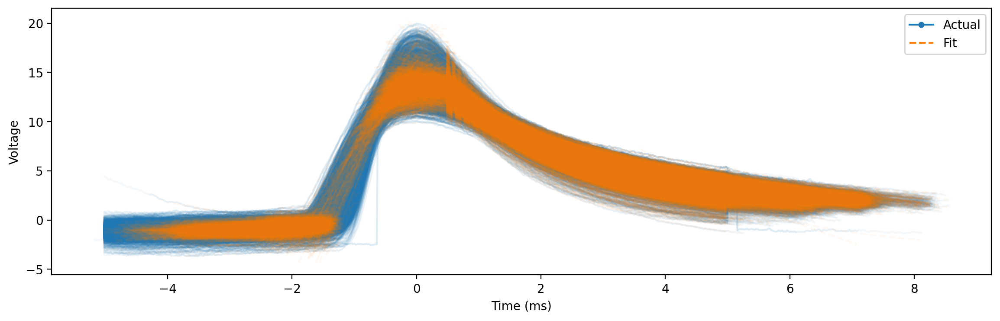

In [11]:
sp.plot()

### Filter spikes 

In [12]:
sp.filter_features()

### Get spike dataframe (with spike times column)

In [13]:

df_features = sp.df_features

#add columns for spike times, both in idx and ms
df_features['spk_times_idx'] = sp.spike_inds
df_features['spk_times_ms'] = patch_times[sp.spike_inds]
df_features['spk_id'] = range(len(df_features))

In [14]:
df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi,spk_times_idx,spk_times_ms,spk_id
0,0.242514,1.44,0.424077,19.806597,2.14,0.107242,0.624190,0.803966,-0.180664,5993,1.198027e+02,0
2,0.489392,1.18,-0.265466,19.111674,2.08,0.198566,0.681233,1.002143,0.071674,66214,1.323647e+03,1
3,-8.025866,-0.02,10.967281,10.967281,1.82,-0.061362,0.561584,0.453184,2.210913,66273,1.324827e+03,2
4,0.047178,1.22,-0.381477,18.732716,2.12,0.166378,0.615358,0.523479,-0.318966,74403,1.487349e+03,3
5,0.184438,2.22,-0.371501,16.437331,2.42,0.090110,0.572847,0.305851,0.016826,74427,1.487829e+03,4
...,...,...,...,...,...,...,...,...,...,...,...,...
11865,9.074635,0.76,9.159099,10.472358,1.02,0.121236,0.129339,-4.388163,-0.130976,80871215,1.616651e+06,9467
11868,7.669929,0.46,10.149151,10.832885,0.86,-0.091616,0.166301,-1.839216,-1.097118,80876177,1.616750e+06,9468
11869,7.669929,0.54,10.149151,10.921466,0.72,0.076233,0.163951,-2.001321,0.008393,80876181,1.616751e+06,9469
11871,2.082772,1.90,10.856786,7.708658,0.00,-0.045800,0.145662,-3.114566,-0.000208,80876282,1.616753e+06,9470


### Get spike times


In [15]:
spk_times_idx = df_features['spk_times_idx']
spk_times_ms = df_features['spk_times_ms']
spk_ids = df_features['spk_id']

In [16]:
df_features.columns

Index(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp',
       'peak_width', 'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi',
       'spk_times_idx', 'spk_times_ms', 'spk_id'],
      dtype='str')

## STEP 2: Cluster spike groups 

#### Plot distribution of all features

Plotting spike features...
Removing outliers using IQR method (multiplier=3)


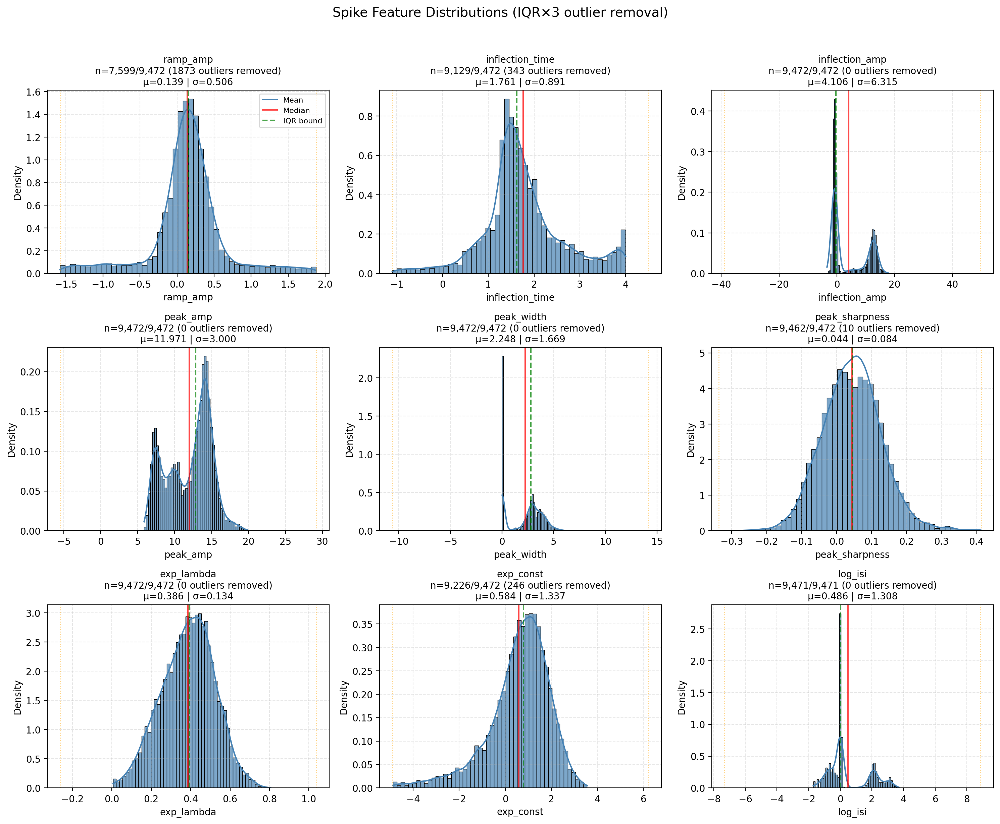


FEATURE DISTRIBUTION SUMMARY
Feature              Total N    Clean N    Outliers   % Removed  Mean       Std       
------------------------------------------------------------------------------------------
ramp_amp             9472       7599       1873       19.8       0.139      0.506     
inflection_time      9472       9129       343        3.6        1.761      0.891     
inflection_amp       9472       9472       0          0.0        4.106      6.315     
peak_amp             9472       9472       0          0.0        11.971     3.000     
peak_width           9472       9472       0          0.0        2.248      1.669     
peak_sharpness       9472       9462       10         0.1        0.044      0.084     
exp_lambda           9472       9472       0          0.0        0.386      0.134     
exp_const            9472       9226       246        2.6        0.584      1.337     
log_isi              9471       9471       0          0.0        0.486      1.308     


In [17]:
plot_spike_feature_distributions(df_features)

In [18]:
cluster_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_df.pkl')

if FORCE_CLUSTER or not os.path.exists(cluster_pickle):
    # scan all numeric features and only cluster the ones that look multimodal
    df_features_clust, rep = cluster_multimodal_features(
        df_features,
        max_k=2,
        suffix="_cluster",
        plot_each=True,  # set True if you want a quick plot per clustered feature, 
        manual_thresholds={"peak_width":3.1
        }
    )
    
    
    with open(cluster_pickle, 'wb') as f:
        pickle.dump(df_features_clust, f)
    print(f"  Saved: {os.path.basename(cluster_pickle)}")
else:
    print(f"  [cache] {os.path.basename(cluster_pickle)}")
    with open(cluster_pickle, 'rb') as f:
        df_features_clust = pickle.load(f)


  [cache] c5_cluster_df.pkl



===== CLUSTER REPORT: inflection_time_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


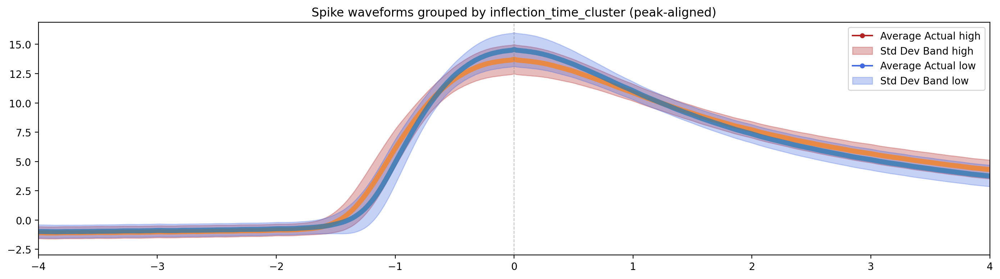


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


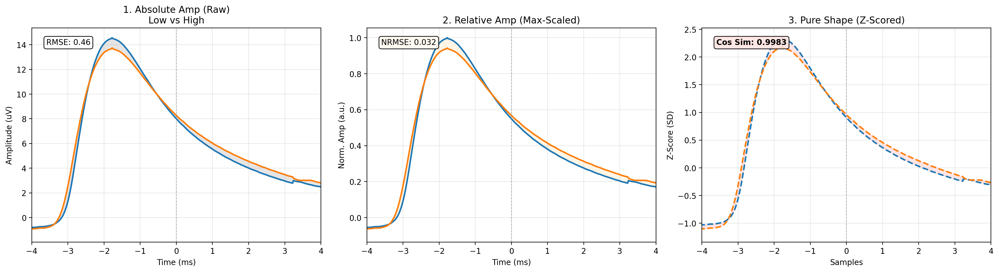


→ 2. Plotting cluster proportions over time


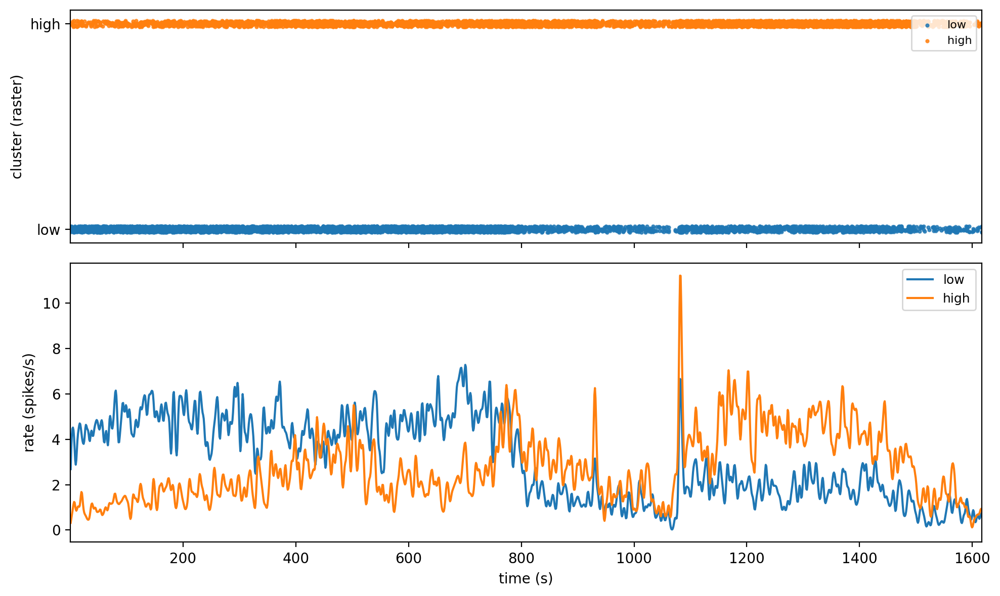


→ 3. Computing cluster transition matrix


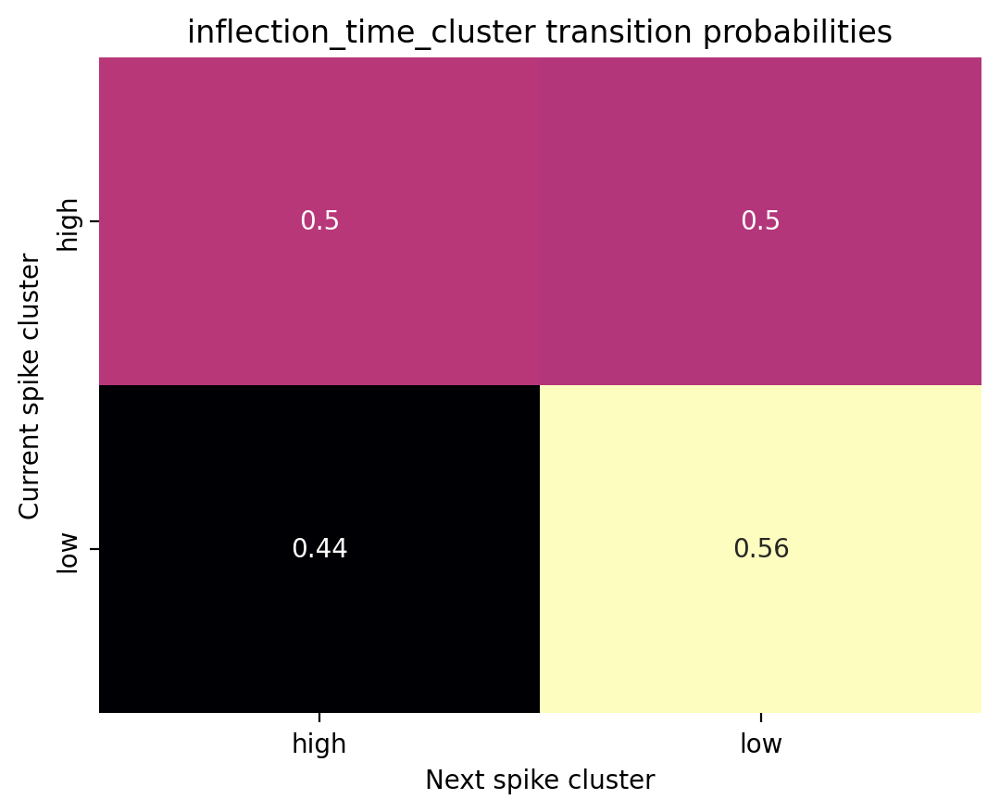


→ 4. Visualizing feature distributions by cluster


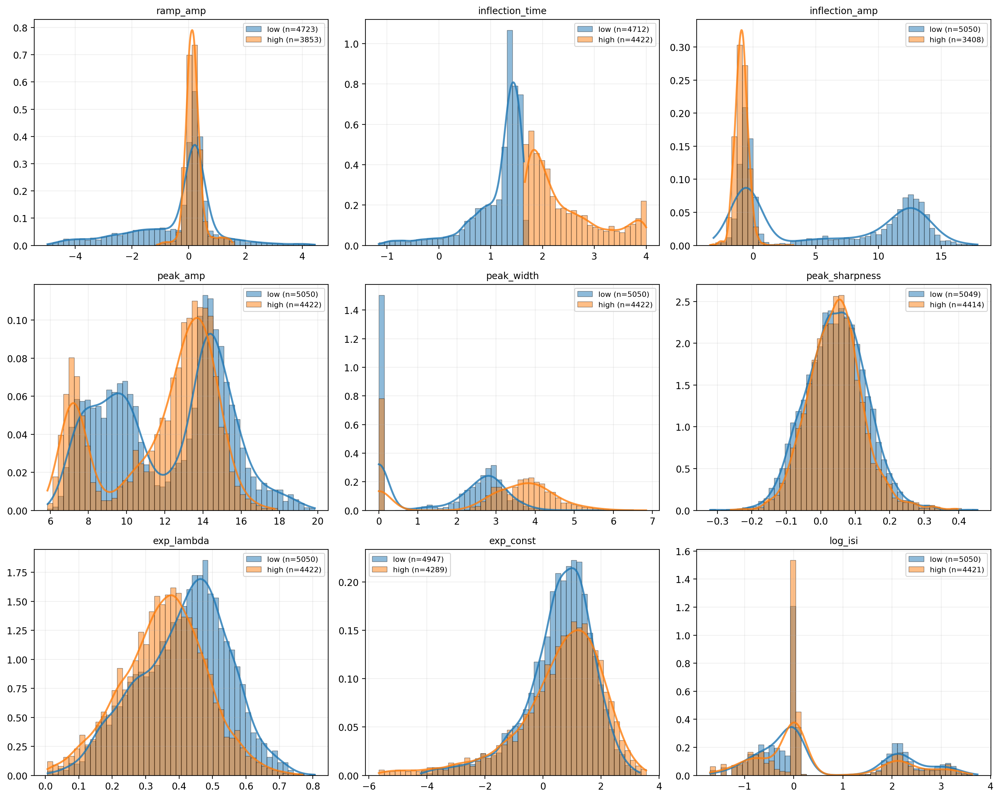


→ 5. Statistical analysis for: inflection_time
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.402
Interpretation: Very Large


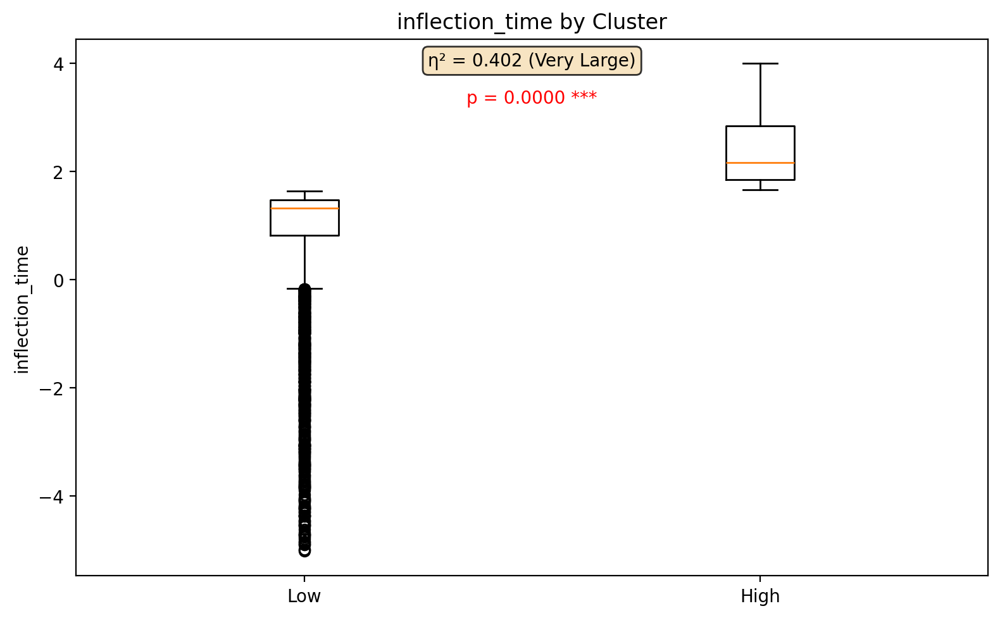


===== REPORT COMPLETE =====


===== CLUSTER REPORT: inflection_amp_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


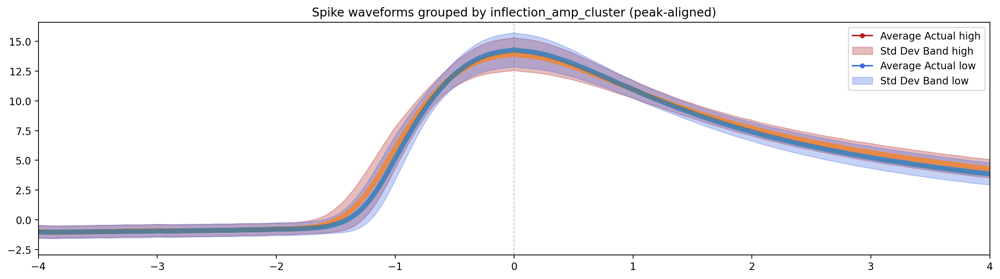


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


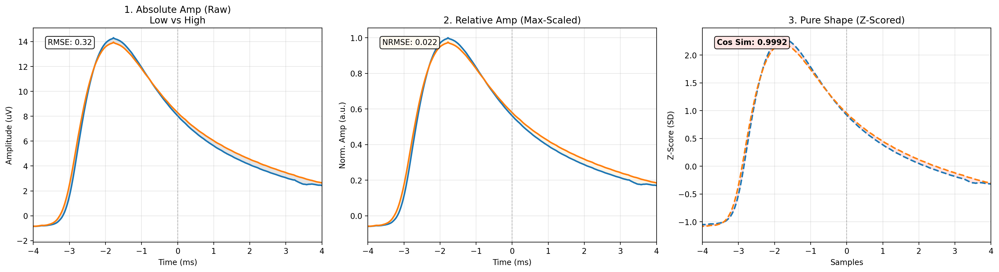


→ 2. Plotting cluster proportions over time


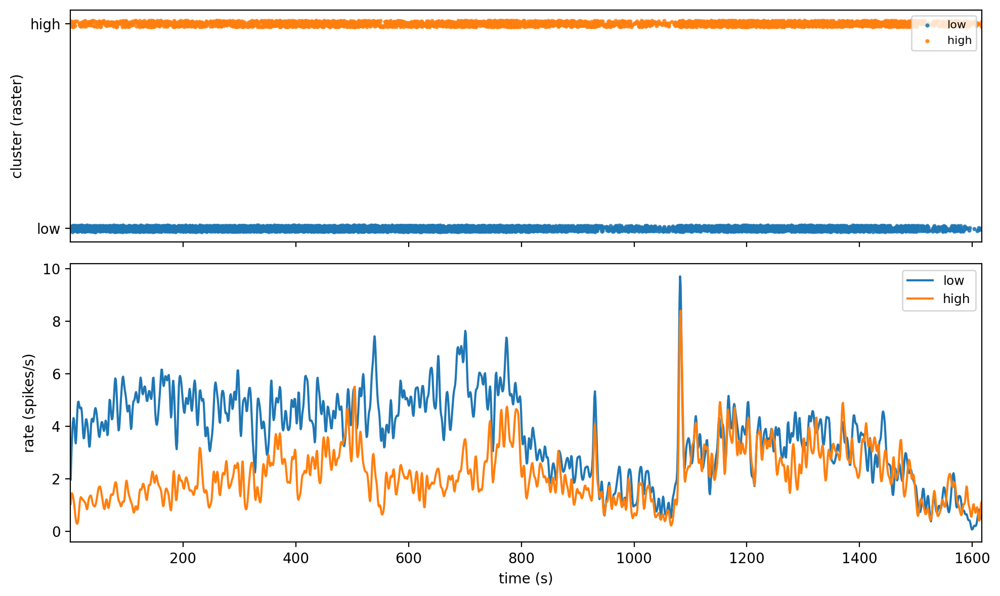


→ 3. Computing cluster transition matrix


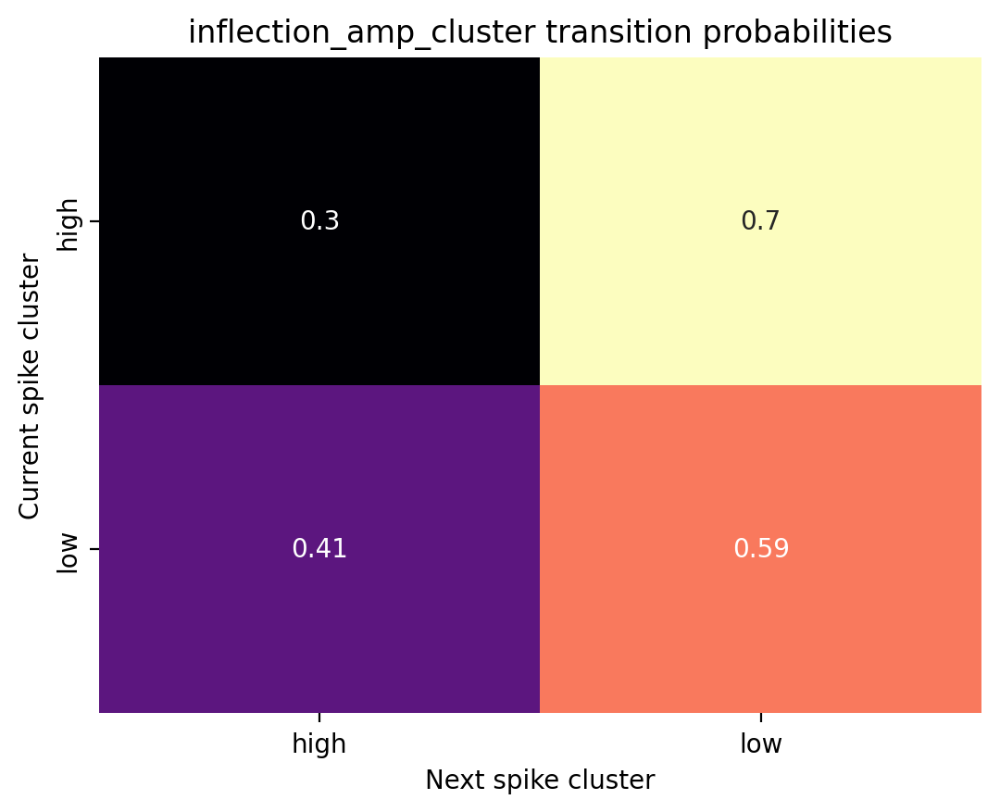


→ 4. Visualizing feature distributions by cluster


Skipping KDE for peak_width (high): Zero variance.


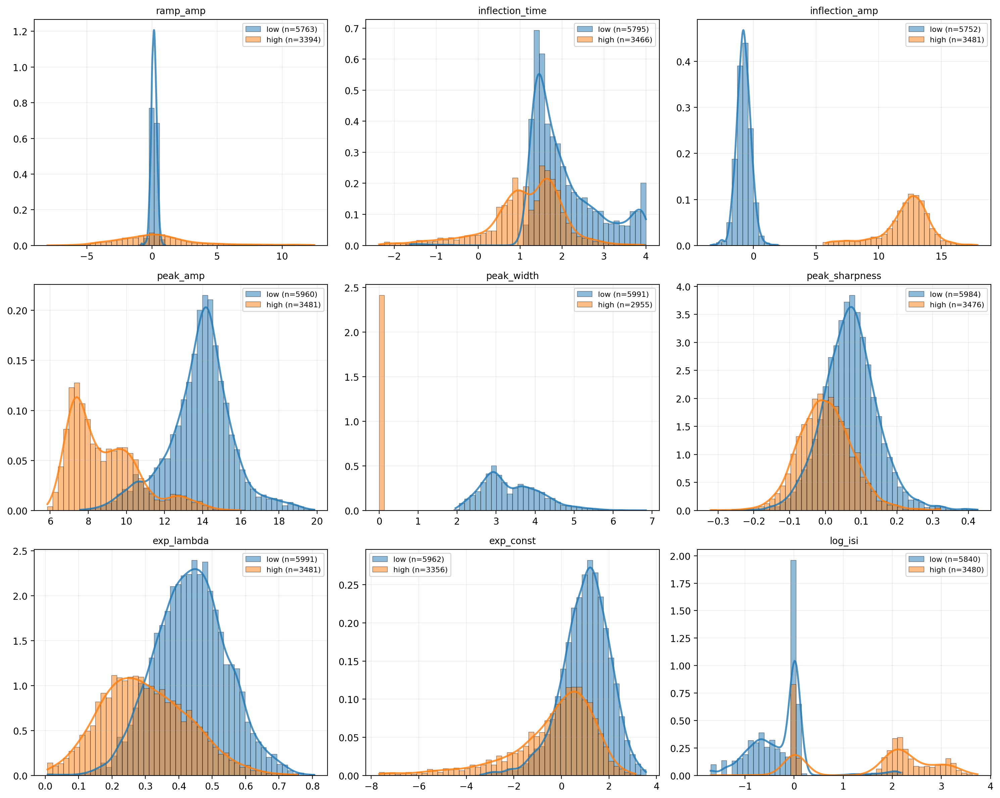


→ 5. Statistical analysis for: inflection_amp
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.943
Interpretation: Very Large


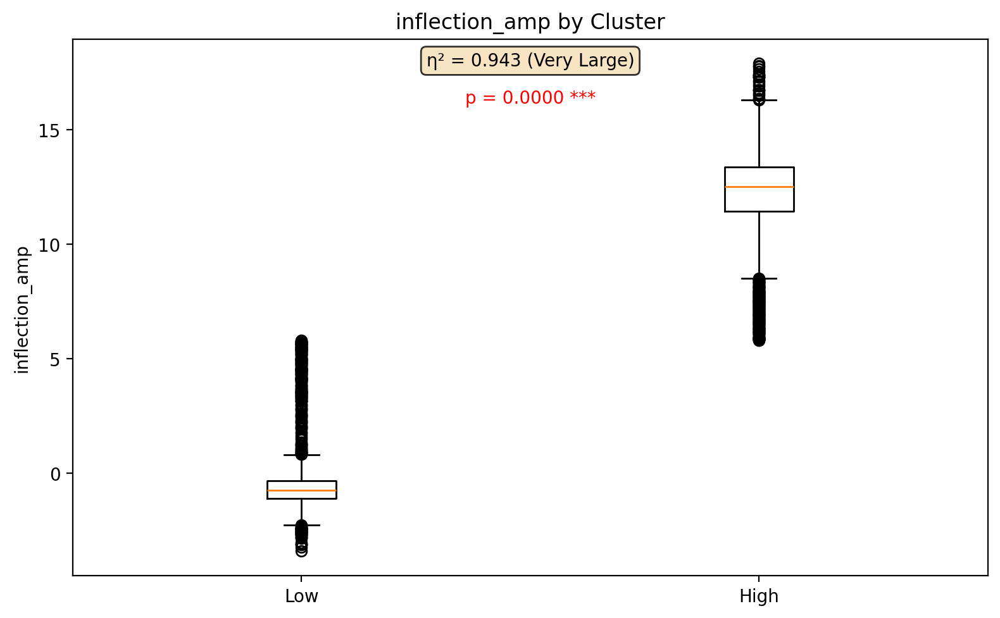


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_amp_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


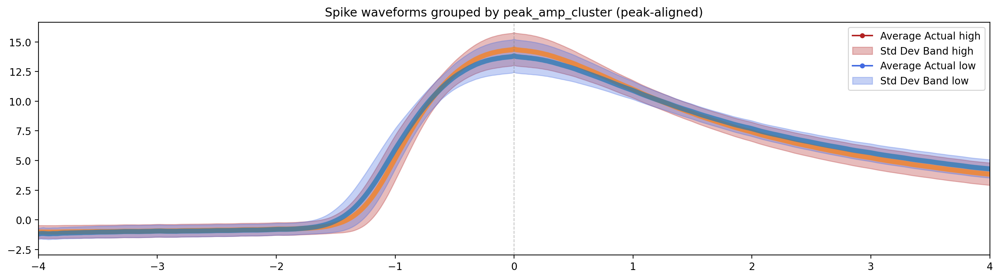


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


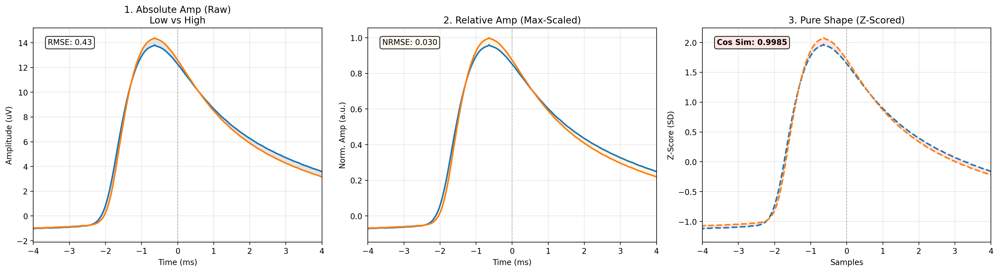


→ 2. Plotting cluster proportions over time


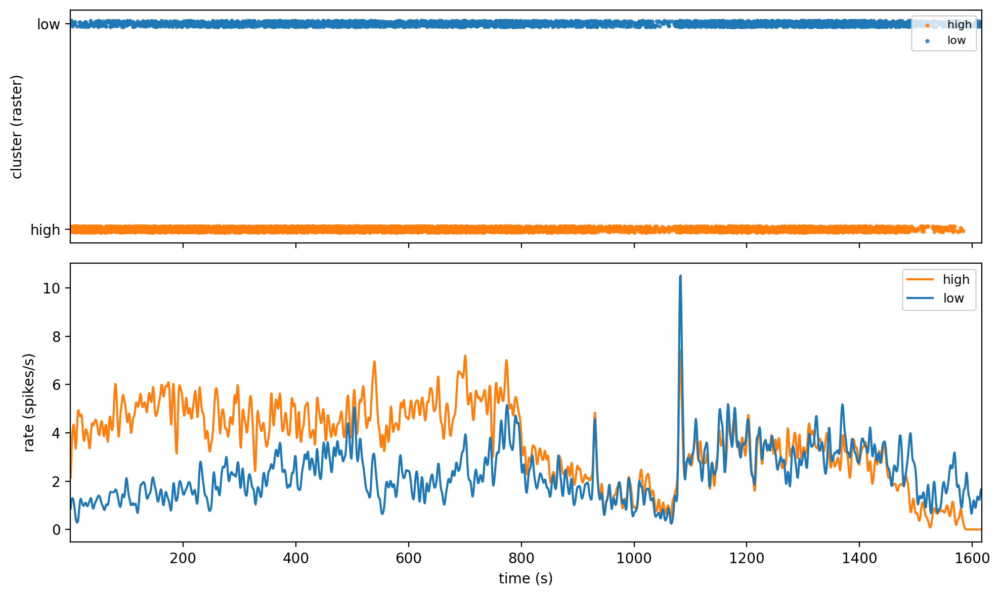


→ 3. Computing cluster transition matrix


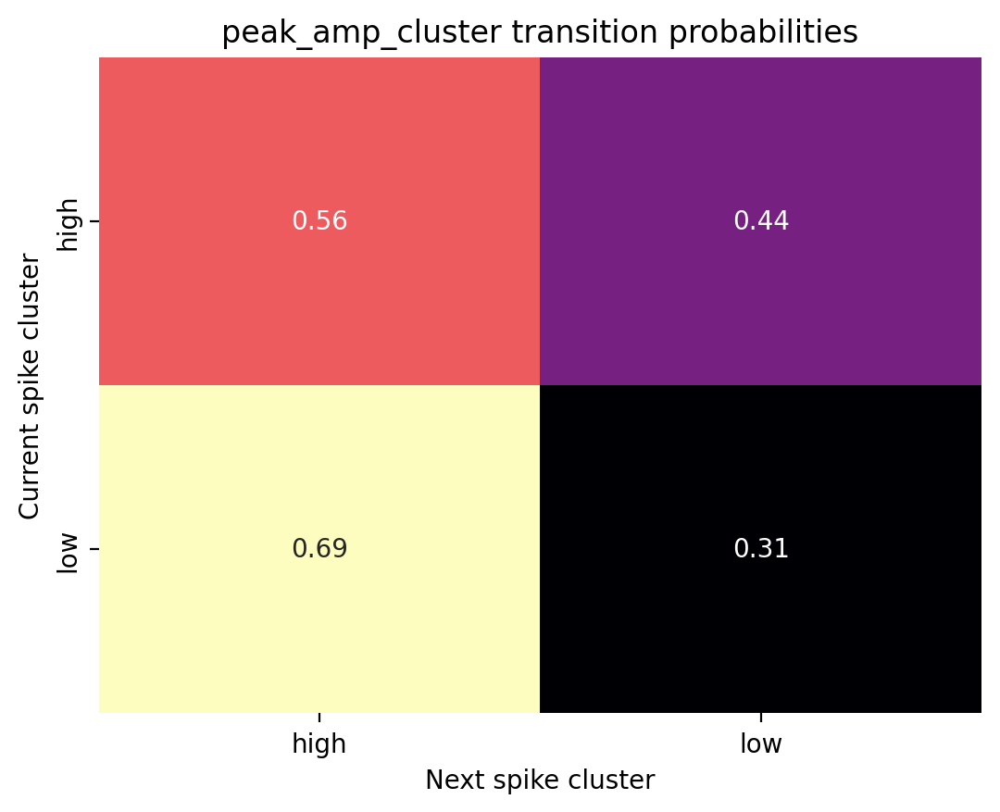


→ 4. Visualizing feature distributions by cluster


Skipping KDE for peak_width (low): Zero variance.


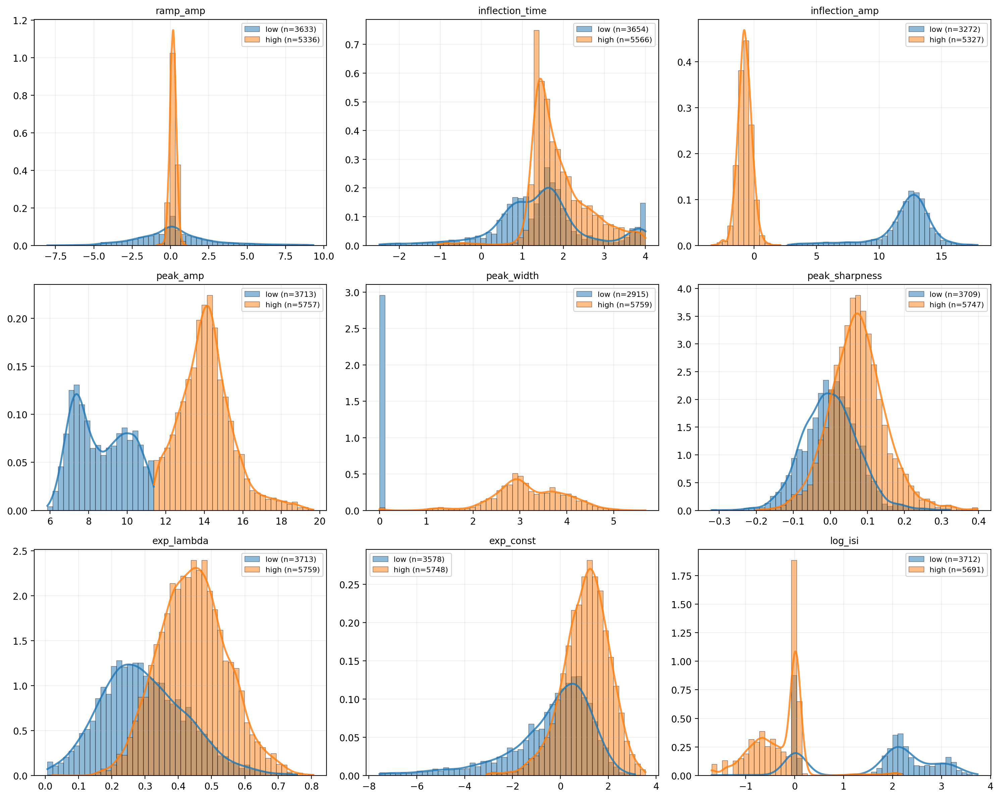


→ 5. Statistical analysis for: peak_amp
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.787
Interpretation: Very Large


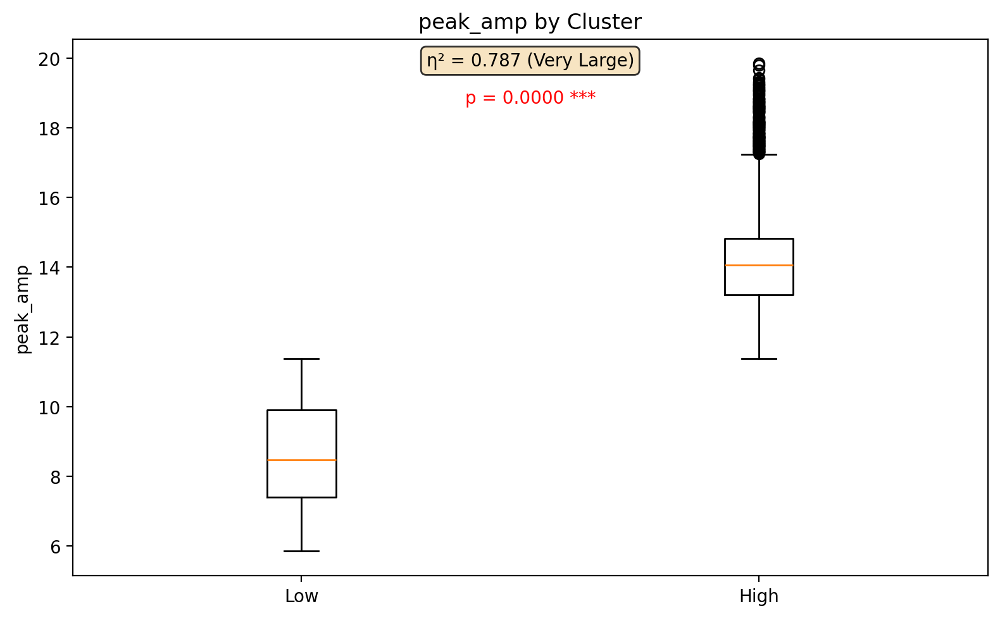


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_width_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


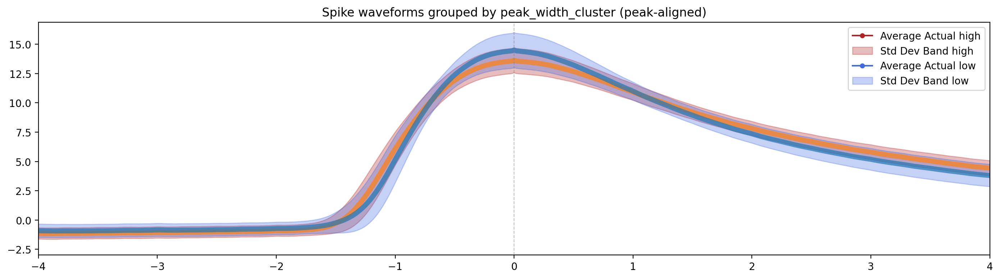


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


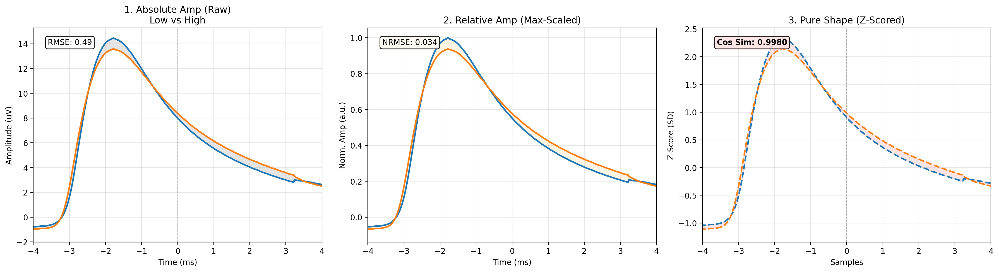


→ 2. Plotting cluster proportions over time


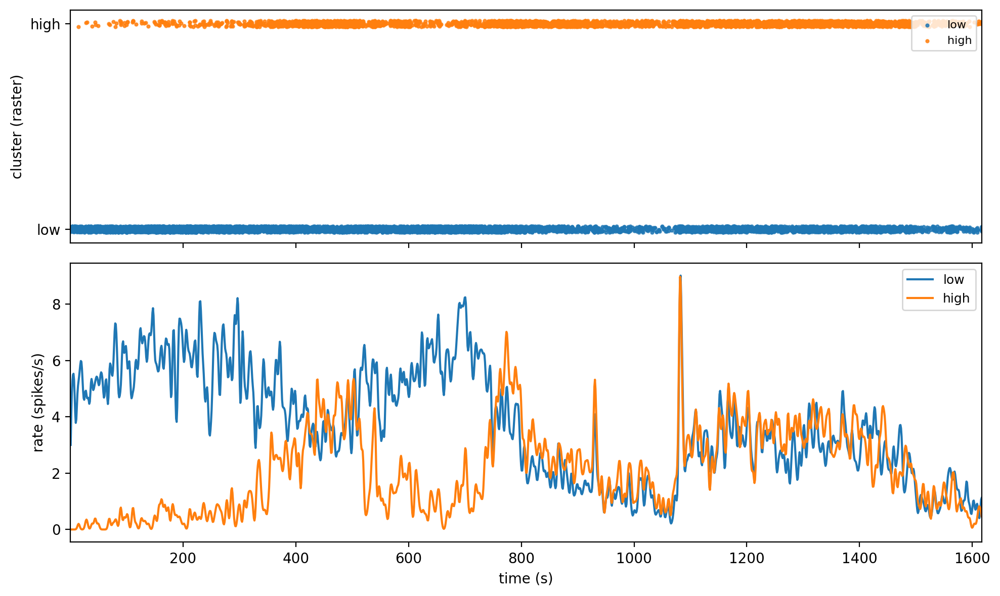


→ 3. Computing cluster transition matrix


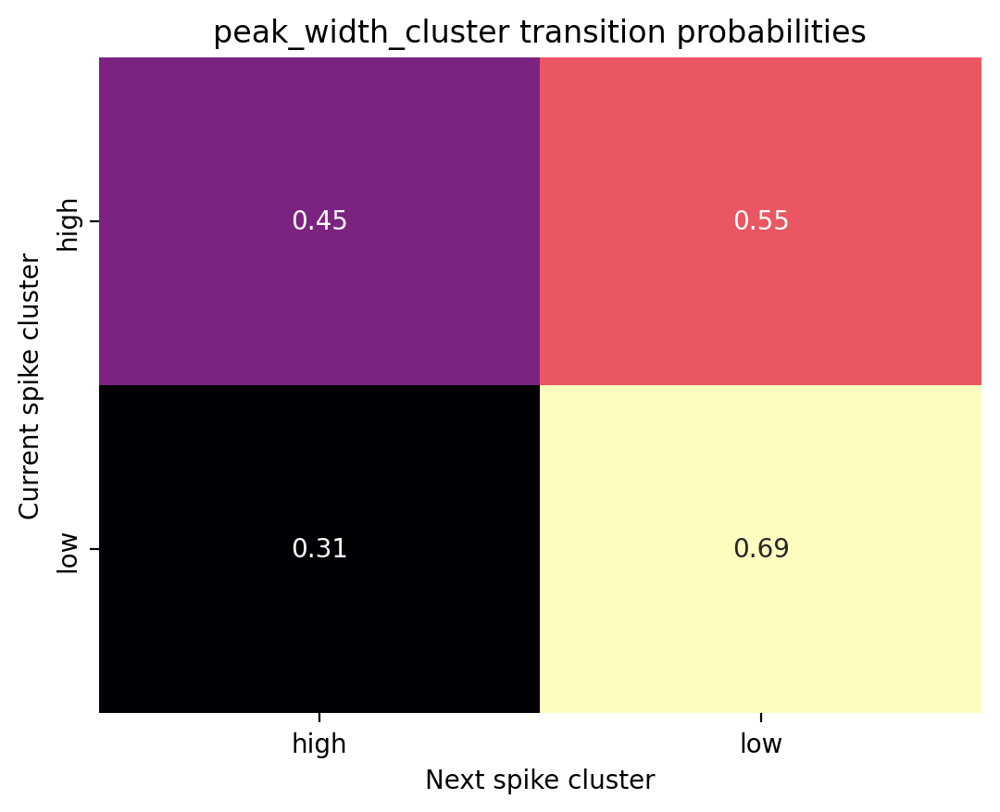


→ 4. Visualizing feature distributions by cluster


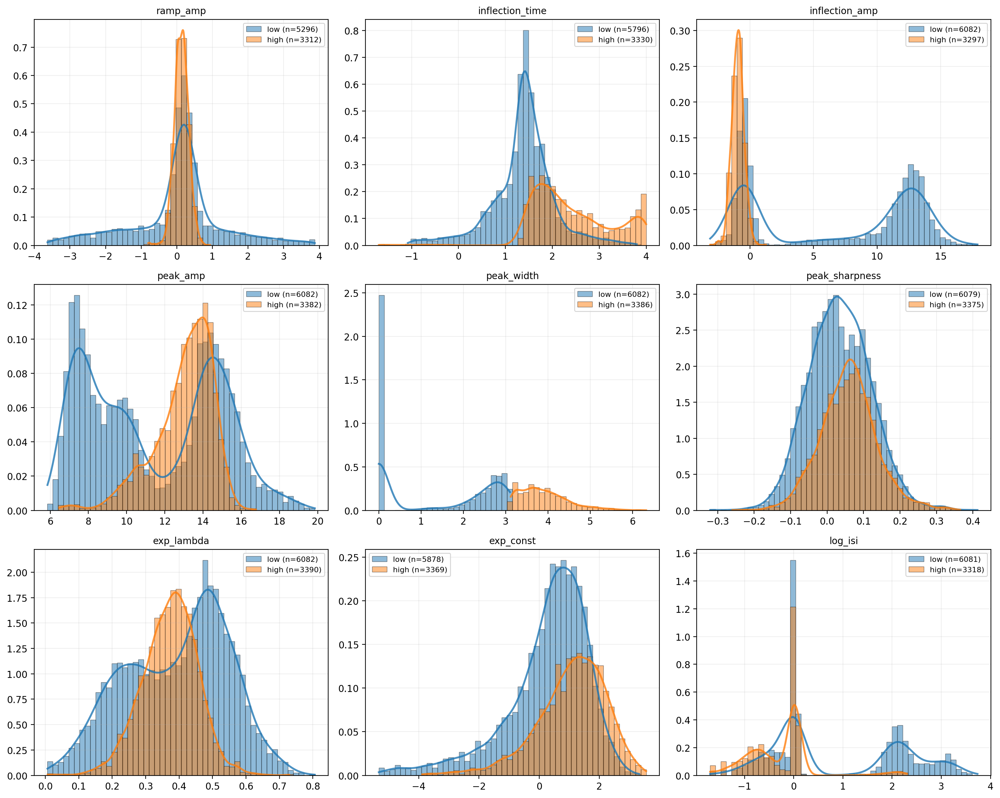


→ 5. Statistical analysis for: peak_width
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.547
Interpretation: Very Large


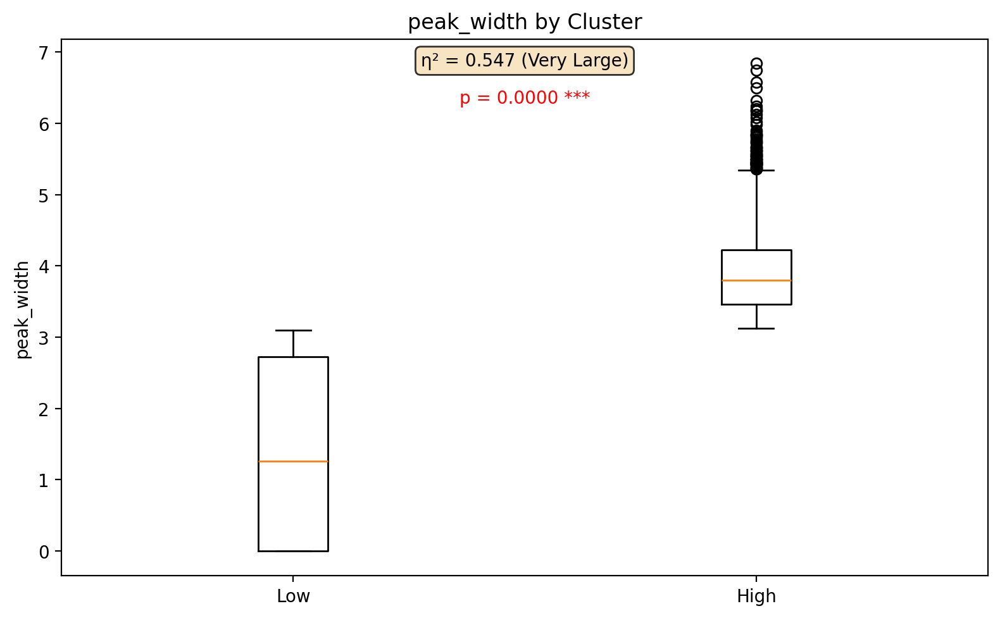


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_sharpness_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


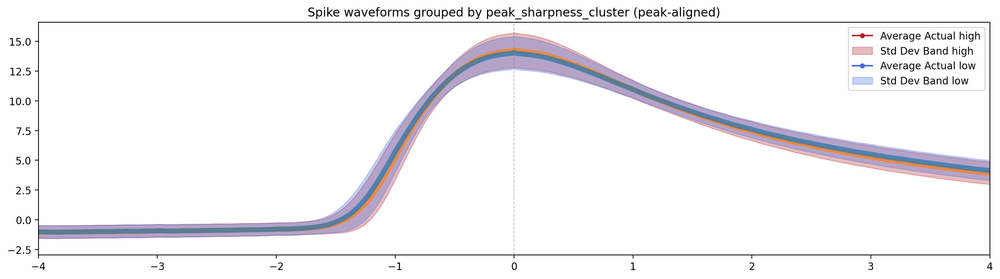


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


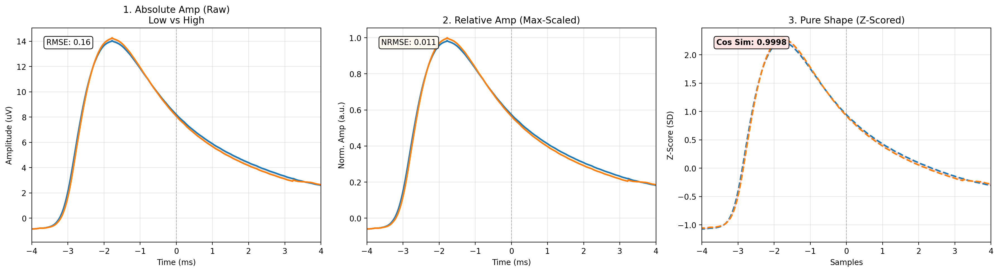


→ 2. Plotting cluster proportions over time


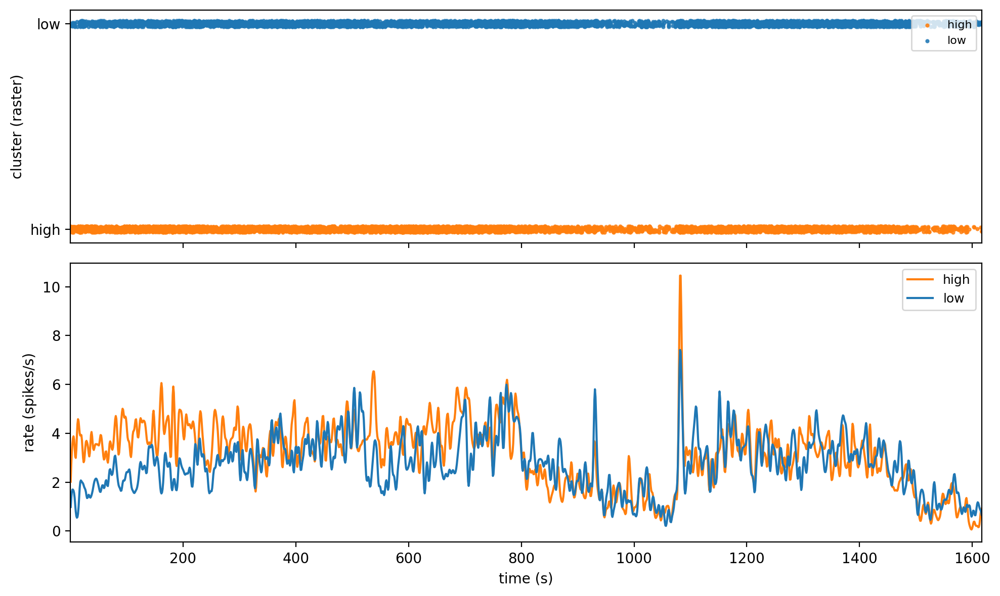


→ 3. Computing cluster transition matrix


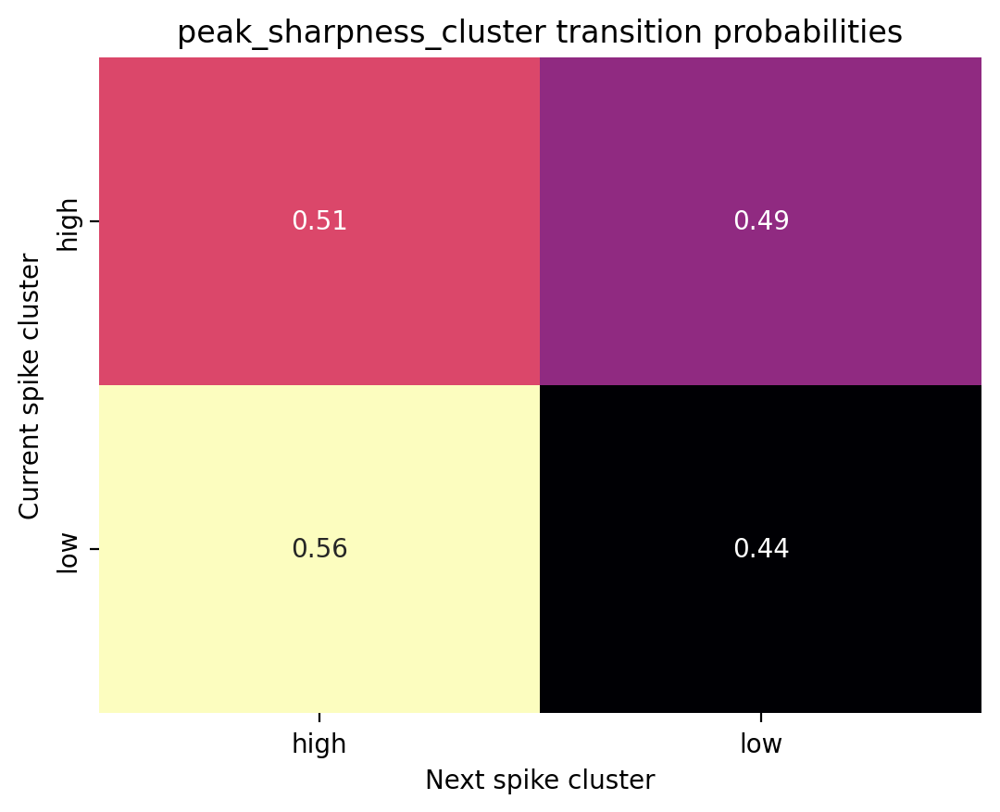


→ 4. Visualizing feature distributions by cluster


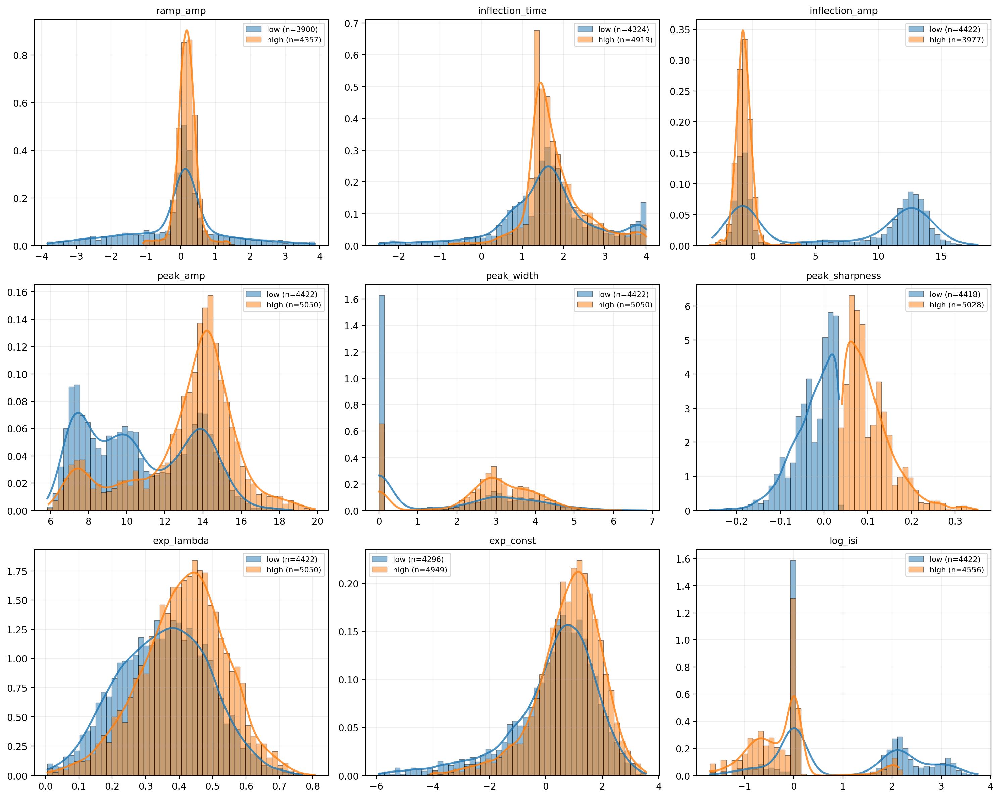


→ 5. Statistical analysis for: peak_sharpness
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.604
Interpretation: Very Large


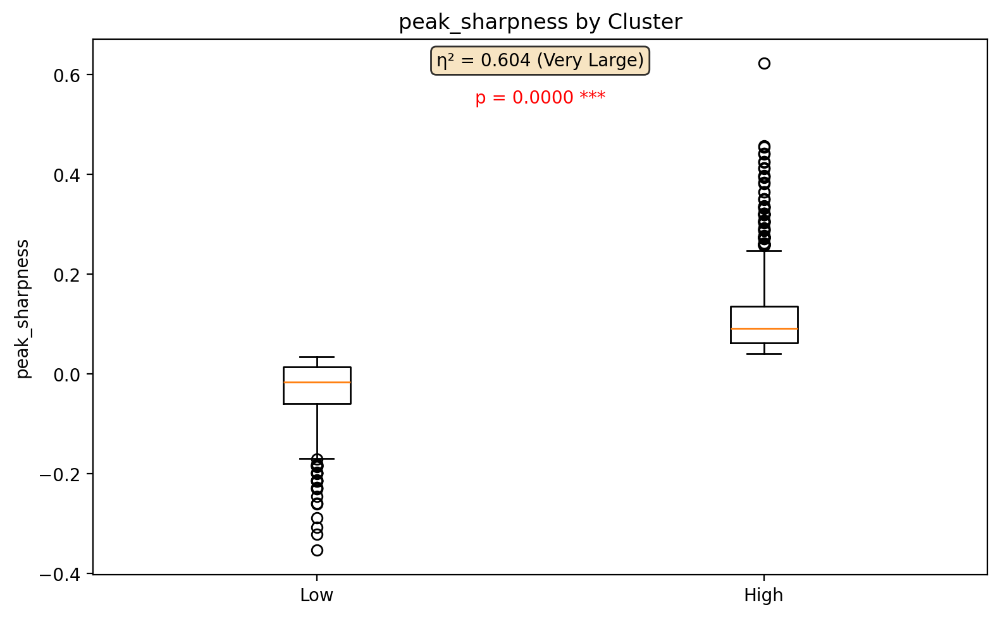


===== REPORT COMPLETE =====


===== CLUSTER REPORT: log_isi_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


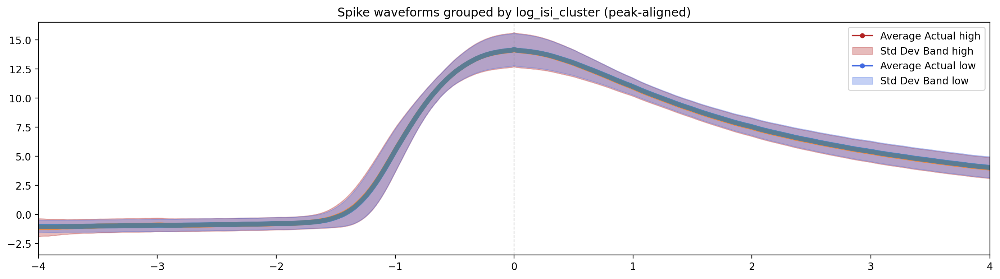


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


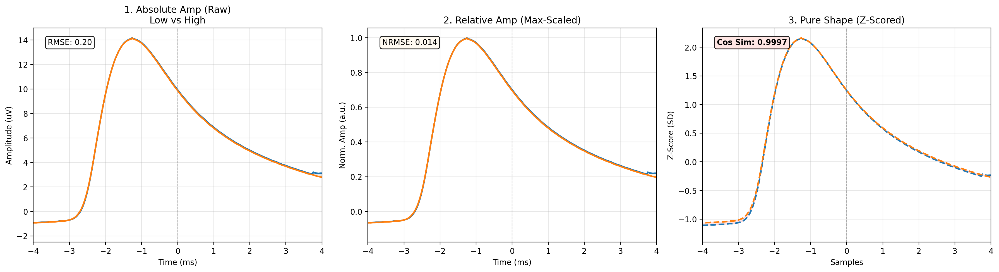


→ 2. Plotting cluster proportions over time


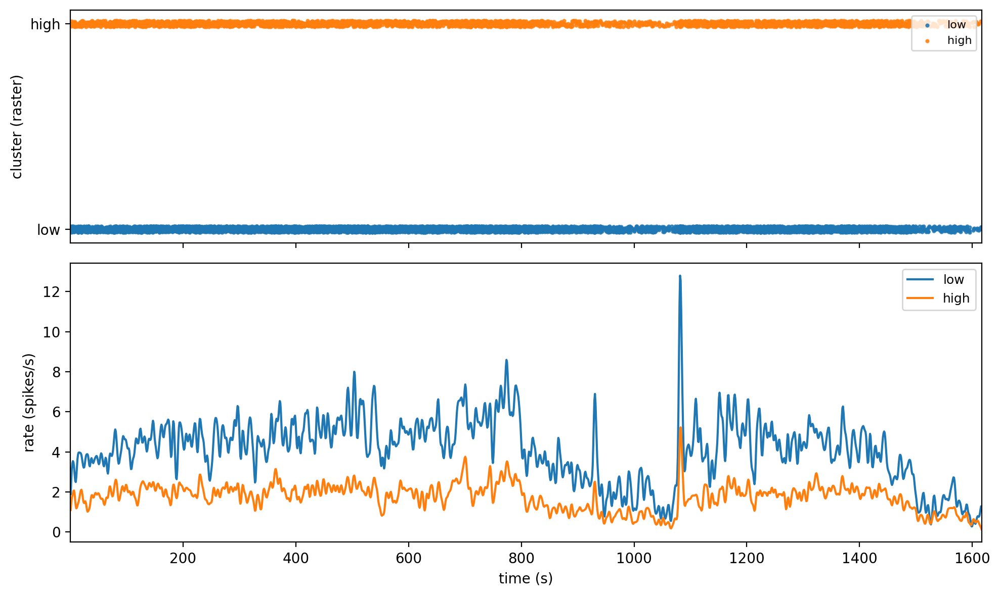


→ 3. Computing cluster transition matrix


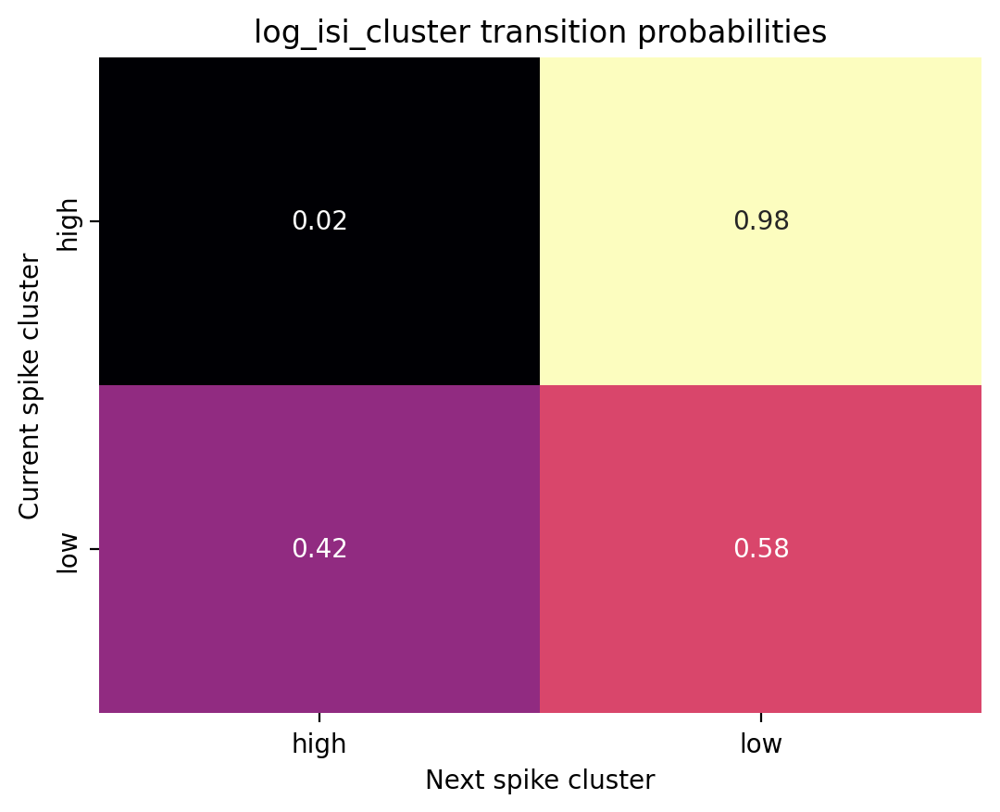


→ 4. Visualizing feature distributions by cluster


Skipping KDE for peak_width (high): Zero variance.


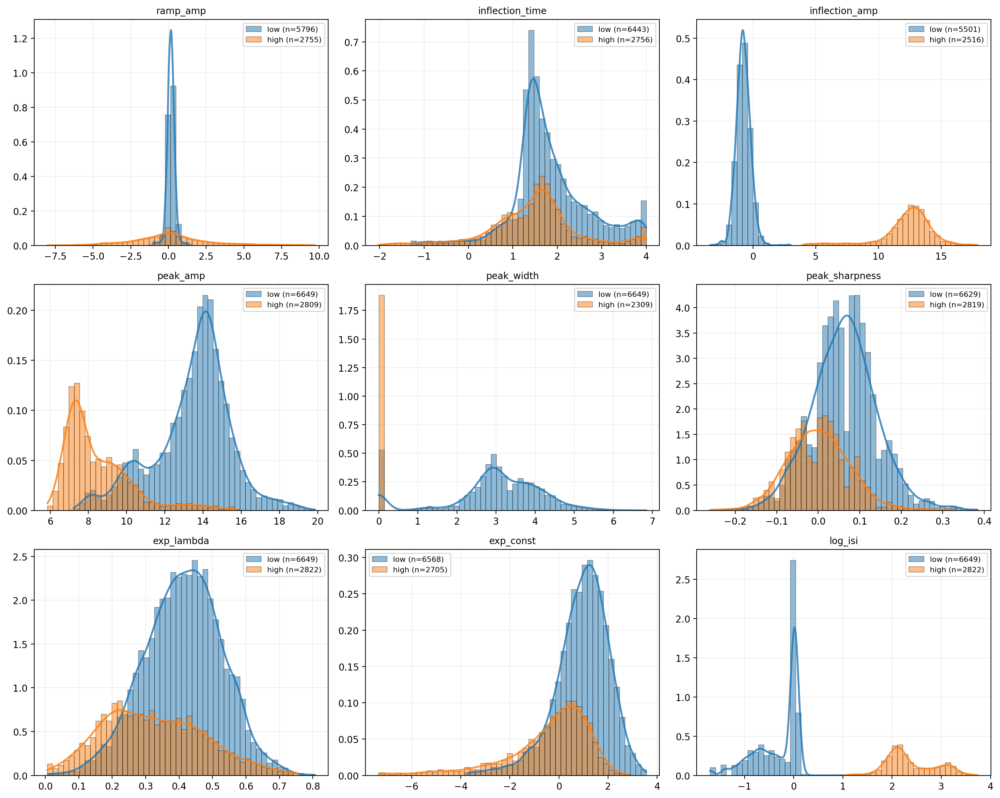


→ 5. Statistical analysis for: log_isi
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.875
Interpretation: Very Large


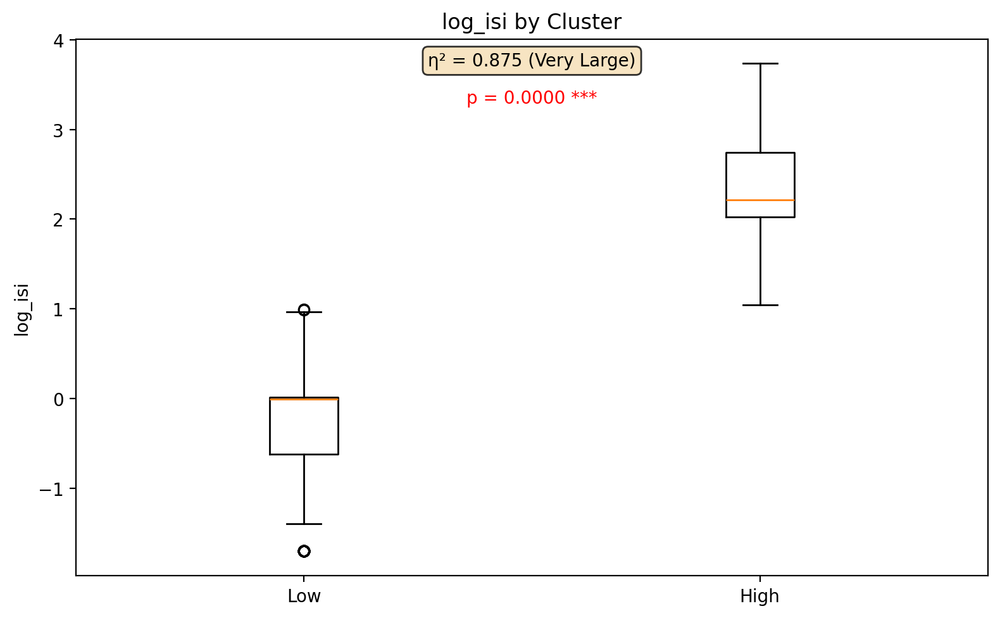


===== REPORT COMPLETE =====



In [19]:
all_reports = []

# Filter columns first to ensure the index is continuous
cluster_cols = [c for c in df_features_clust.columns if c.endswith("_cluster")]

for i, col in enumerate(cluster_cols):
    # Pass 'i' as the cluster_group_id
    row_df = plot_full_cluster_report(df_features_clust, sp, col, cluster_group_id=i)
    all_reports.append(row_df)

# Final Master DataFrame
master_report_df = pd.concat(all_reports, ignore_index=True)

In [20]:
# Save cluster quality report for population-level comparison analysis
report_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_report.pkl')
with open(report_pickle, 'wb') as f:
    pickle.dump(master_report_df, f)


In [21]:
# Compute and save peak-aligned average waveforms for each cluster group.
# Saved to a lightweight pickle used by the population comparison notebook.
wf_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_waveforms.pkl')
if FORCE_CLUSTER or not os.path.exists(wf_pickle):
    cluster_cols = [c for c in df_features_clust.columns if c.endswith('_cluster')]
    wf_data = compute_cluster_waveforms(sp, df_features_clust, cluster_cols)
    with open(wf_pickle, 'wb') as f:
        pickle.dump(wf_data, f)
    print(f"  Saved: {os.path.basename(wf_pickle)}")
else:
    print(f"  [cache] {os.path.basename(wf_pickle)}")


  [cache] c5_cluster_waveforms.pkl
